## CIS 580, Machine Perception, Fall 2023
### Homework 5
#### Due: December 22 2023, 11:59pm ET

Instructions: Create a folder in your Google Drive and place inside this .ipynb file. Open the jupyter notebook with Google Colab. Refrain from using a GPU during implementing and testing the whole thing. You should switch to a GPU runtime only when performing the final training (of the 2D image or the NeRF) to avoid GPU usage runouts.

### Part 1: Fitting a 2D Image

In [27]:
import numpy as np
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import imageio.v2 as imageio
import time
import gdown

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


We first download the image from the web. We normalize the image so the pixels are in between the range of [0,1].

In [28]:
url = "https://drive.google.com/file/d/1rD1aaxN8aSynZ8OPA7EI3G936IF0vcUt/view?usp=sharing"
gdown.download(url=url, output='starry_night.jpg', quiet=False, fuzzy=True)

# Load painting image
painting = imageio.imread("starry_night.jpg")
painting = torch.from_numpy(np.array(painting, dtype=np.float32)/255.).to(device)
height_painting, width_painting = painting.shape[:2]

Downloading...
From: https://drive.google.com/uc?id=1rD1aaxN8aSynZ8OPA7EI3G936IF0vcUt
To: /home/ubuntu/starry_night.jpg
100%|██████████| 5.65k/5.65k [00:00<00:00, 16.8MB/s]


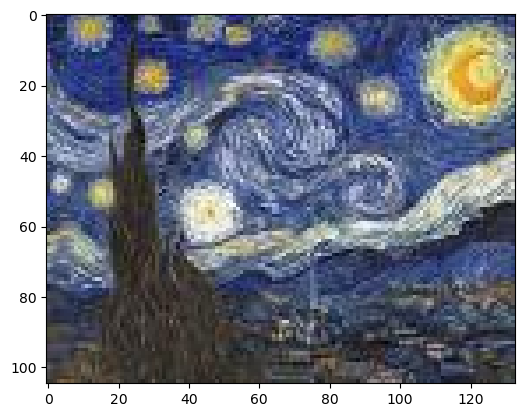

In [29]:

plt.imshow(painting.cpu().numpy())

1.1 Complete the function positional_encoding()

In [30]:
import math
def positional_encoding(x, num_frequencies=6, incl_input=True):

    """
    Apply positional encoding to the input.

    Args:
    x (torch.Tensor): Input tensor to be positionally encoded.
      The dimension of x is [N, D], where N is the number of input coordinates,
      and D is the dimension of the input coordinate.
    num_frequencies (optional, int): The number of frequencies used in
     the positional encoding (default: 6).
    incl_input (optional, bool): If True, concatenate the input with the
        computed positional encoding (default: True).

    Returns:
    (torch.Tensor): Positional encoding of the input tensor.
    """

    results = []
    if incl_input:
        results.append(x)

    #############################  TODO 1(a) BEGIN  ############################
    # encode input tensor and append the encoded tensor to the list of results.

    for i in range(num_frequencies):
      # sin_pos = torch.sin(2**i*math.pi*x)
      # cos_pos = torch.cos(2**i*math.pi*x)
      results.append(torch.sin(2**i*math.pi*x))
      results.append(torch.cos(2**i*math.pi*x))


    #############################  TODO 1(a) END  ##############################
    return torch.cat(results, dim=-1)

1.2 Complete the class model_2d() that will be used to fit the 2D image.


In [31]:
class model_2d(nn.Module):

    """
    Define a 2D model comprising of three fully connected layers,
    two relu activations and one sigmoid activation.
    """

    def __init__(self, filter_size=128, num_frequencies=6):
        super().__init__()
        #############################  TODO 1(b) BEGIN  ############################
        # for autograder compliance, please follow the given naming for your layers
        self.layer_in = nn.Linear(4*num_frequencies + 2, filter_size)
        self.layer = nn.Linear(filter_size, filter_size)
        self.layer_out = nn.Linear(filter_size, 3)

        #############################  TODO 1(b) END  ##############################

    def forward(self, x):
        #############################  TODO 1(b) BEGIN  ############################
        # example of forward through a layer: y = self.layer_in(x)
        l1 = torch.relu(self.layer_in(x))
        l2 = torch.relu(self.layer(l1))
        out = torch.sigmoid(self.layer_out(l2))

        #############################  TODO 1(b) END  ##############################
        return out

In [32]:
def normalize_coord(height, width, num_frequencies=6):

    """
    Creates the 2D normalized coordinates, and applies positional encoding to them

    Args:
    height (int): Height of the image
    width (int): Width of the image
    num_frequencies (optional, int): The number of frequencies used in
      the positional encoding (default: 6).

    Returns:
    (torch.Tensor): Returns the 2D normalized coordinates after applying positional encoding to them.
    """

    #############################  TODO 1(c) BEGIN  ############################
    # Create the 2D normalized coordinates, and apply positional encoding to them

    x_idx = torch.linspace(0,1, width)
    y_idx = torch.linspace(0, 1, height)

    embeddings = torch.zeros((height*width, 2))

    #TODO: Vectorize
    for j in range(height):
      for i in range(width):
        embeddings[j*width + i] = torch.tensor([x_idx[i], y_idx[j]])


    embedded_coordinates = positional_encoding(embeddings, num_frequencies= num_frequencies)

    #############################  TODO 1(c) END  ############################

    return embedded_coordinates

You need to complete 1.1 and 1.2 first before completing the train_2d_model function. Don't forget to transfer the completed functions from 1.1 and 1.2 to the part1.py file and upload it to the autograder.

Fill the gaps in the train_2d_model() function to train the model to fit the 2D image.

In [33]:
def train_2d_model(test_img, num_frequencies, device, model=model_2d, positional_encoding=positional_encoding, show=True):

    # Optimizer parameters
    lr = 5e-4
    iterations = 10000
    height, width = test_img.shape[:2]

    # Number of iters after which stats are displayed
    display = 2000

    # Define the model and initialize its weights.
    model2d = model(num_frequencies=num_frequencies)
    model2d.to(device)

    def weights_init(m):
        if isinstance(m, nn.Linear):
            torch.nn.init.xavier_uniform_(m.weight)

    model2d.apply(weights_init)

    #############################  TODO 1(c) BEGIN  ############################
    # Define the optimizer
    optimizer = torch.optim.Adam(model2d.parameters(), lr = lr)

    #############################  TODO 1(c) END  ############################

    # Seed RNG, for repeatability
    seed = 5670
    torch.manual_seed(seed)
    np.random.seed(seed)

    # Lists to log metrics etc.
    psnrs = []
    iternums = []

    t = time.time()
    t0 = time.time()

    #############################  TODO 1(c) BEGIN  ############################
    # Create the 2D normalized coordinates, and apply positional encoding to them
    model2d.to(device)
    data_encoded = normalize_coord(height, width, num_frequencies)
    #############################  TODO 1(c) END  ############################

    mse_loss = nn.MSELoss()
    for i in range(iterations+1):
        optimizer.zero_grad()
        #############################  TODO 1(c) BEGIN  ############################
        # Run one iteration
        data_encoded = data_encoded.to(device)
        pred = model2d(data_encoded)

        pred = pred.reshape((height, width, 3))
        # Compute mean-squared error between the predicted and target images. Backprop!
        loss = mse_loss(pred, test_img)
        loss.backward()
        optimizer.step()
        #############################  TODO 1(c) END  ############################

        # Display images/plots/stats
        if i % display == 0 and show:
            #############################  TODO 1(c) BEGIN  ############################
            # Calculate psnr
            psnr = 10*torch.log10(1 / loss)
            #############################  TODO 1(c) END  ############################

            print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f" % psnr.item(), \
                "Time: %.2f secs per iter" % ((time.time() - t) / display), "%.2f secs in total" % (time.time() - t0))
            t = time.time()

            psnrs.append(psnr.item())
            iternums.append(i)

            plt.figure(figsize=(13, 4))
            plt.subplot(131)
            plt.imshow(pred.detach().cpu().numpy())
            plt.title(f"Iteration {i}")
            plt.subplot(132)
            plt.imshow(test_img.cpu().numpy())
            plt.title("Target image")
            plt.subplot(133)
            plt.plot(iternums, psnrs)
            plt.title("PSNR")
            plt.show()

    print('Done!')
    torch.save(model2d.state_dict(),'model_2d_' + str(num_frequencies) + 'freq.pt')
    plt.imsave('van_gogh_' + str(num_frequencies) + 'freq.png',pred.detach().cpu().numpy())
    return pred.detach().cpu()

Train the model to fit the given image without applying positional encoding to the input, and by applying positional encoding of two different frequencies to the input; L = 2 and L = 6.

Iteration 0  Loss: 0.0480  PSNR: 13.18 Time: 0.00 secs per iter 0.17 secs in total


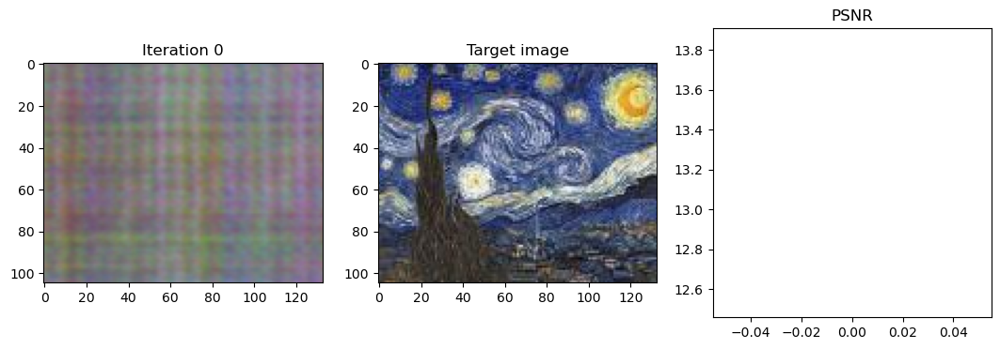

Iteration 2000  Loss: 0.0031  PSNR: 25.07 Time: 0.00 secs per iter 2.39 secs in total


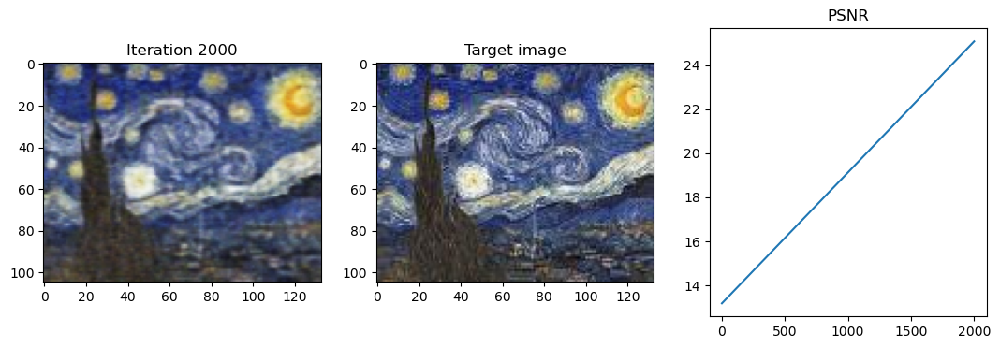

Iteration 4000  Loss: 0.0022  PSNR: 26.48 Time: 0.00 secs per iter 4.62 secs in total


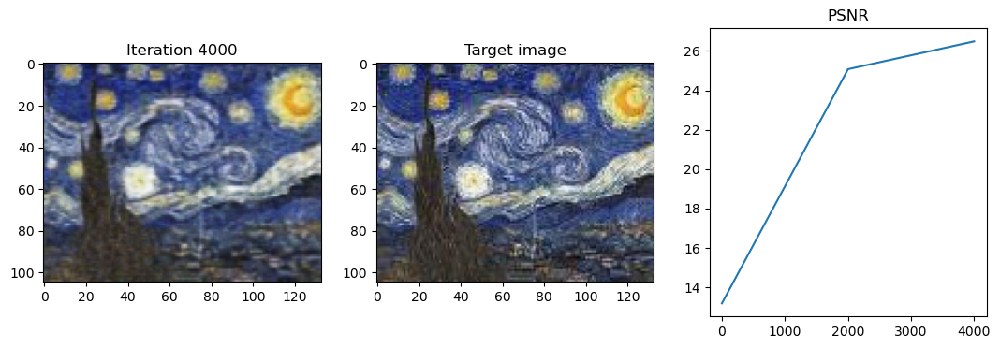

Iteration 6000  Loss: 0.0019  PSNR: 27.28 Time: 0.00 secs per iter 6.82 secs in total


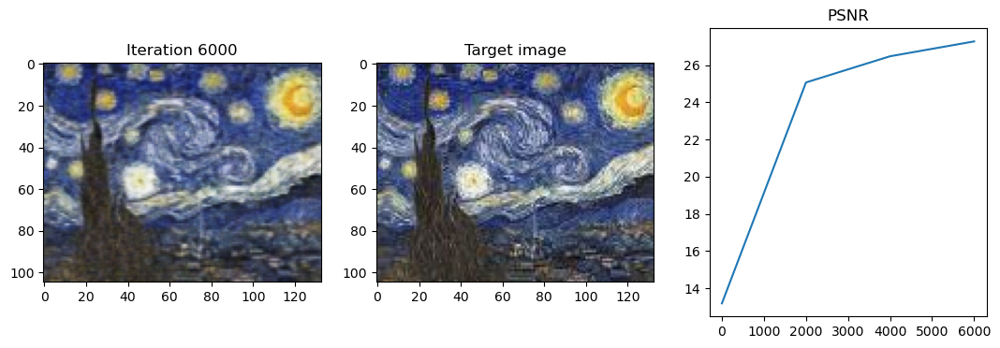

Iteration 8000  Loss: 0.0016  PSNR: 27.97 Time: 0.00 secs per iter 9.01 secs in total


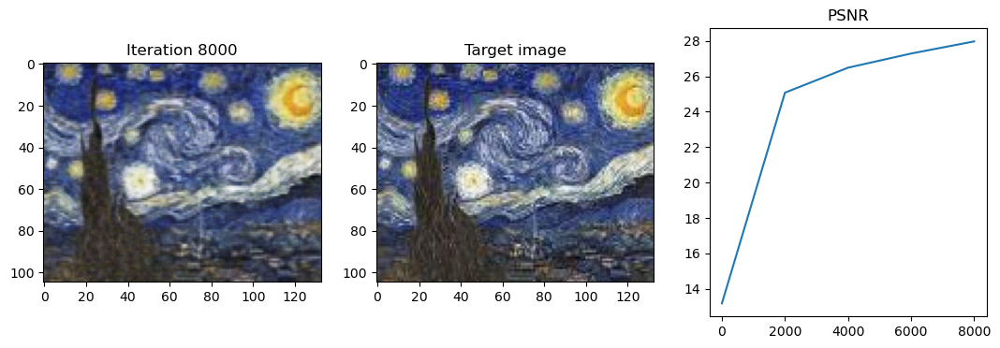

Iteration 10000  Loss: 0.0014  PSNR: 28.45 Time: 0.00 secs per iter 11.20 secs in total


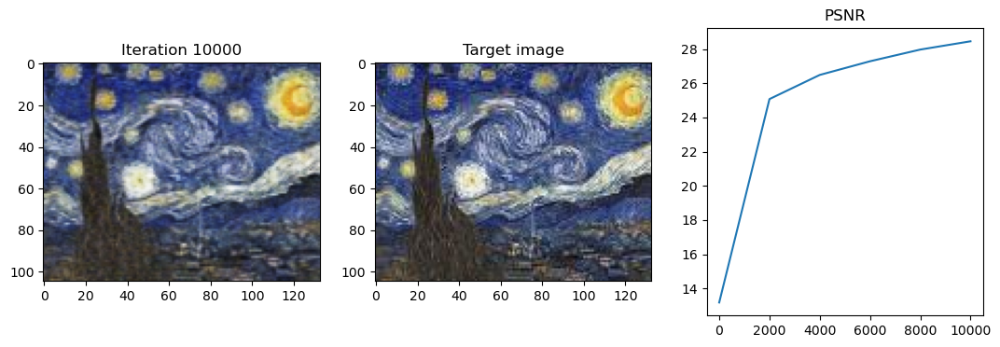

Done!


In [34]:
_ = train_2d_model(test_img=painting, num_frequencies=6, device=device)

### Part 2: Fitting a 3D Image

In [35]:
import os
import gdown
import numpy as np
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.functional as F
import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [36]:
url = "https://drive.google.com/file/d/13eBK_LWxs4SkruFKH7glKK9jwQU1BkXK/view?usp=sharing"
gdown.download(url=url, output='lego_data.npz', quiet=False, fuzzy=True)

Downloading...
From: https://drive.google.com/uc?id=13eBK_LWxs4SkruFKH7glKK9jwQU1BkXK
To: /home/ubuntu/lego_data.npz
100%|██████████| 12.7M/12.7M [00:00<00:00, 113MB/s]


'lego_data.npz'

Here, we load the data that is comprised by the images, the R and T matrices of each camera position with respect to the world coordinates and the intrinsics parameters K of the camera.

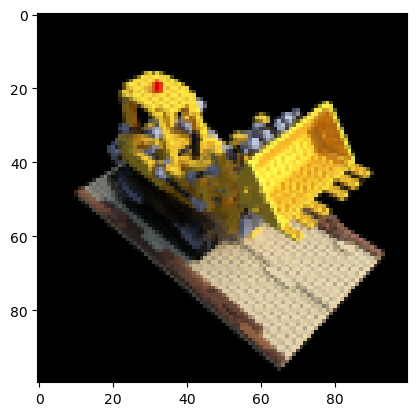

In [37]:
# Load input images, poses, and intrinsics
data = np.load("lego_data.npz")

# Images
images = data["images"]

# Height and width of each image
height, width = images.shape[1:3]

# Camera extrinsics (poses)
poses = data["poses"]
poses = torch.from_numpy(poses).to(device)

# Camera intrinsics
intrinsics = data["intrinsics"]
intrinsics = torch.from_numpy(intrinsics).to(device)

# Hold one image out (for test).
test_image, test_pose = images[101], poses[101]
test_image = torch.from_numpy(test_image).to(device)

# Map images to device
images = torch.from_numpy(images[:100, ..., :3]).to(device)

plt.imshow(test_image.detach().cpu().numpy())
plt.show()

In [38]:
device

device(type='cuda')

2.1 Complete the following function that calculates the rays that pass through all the pixels of an HxW image

In [39]:
def get_rays(height, width, intrinsics, w_R_c, w_T_c):

    """
    Compute the origin and direction of rays passing through all pixels of an image (one ray per pixel).

    Args:
    height: the height of an image.
    width: the width of an image.
    intrinsics: camera intrinsics matrix of shape (3, 3).
    w_R_c: Rotation matrix of shape (3,3) from camera to world coordinates.
    w_T_c: Translation vector of shape (3,1) that transforms

    Returns:
    ray_origins (torch.Tensor): A tensor of shape (height, width, 3) denoting the centers of
      each ray. Note that desipte that all ray share the same origin, here we ask you to return
      the ray origin for each ray as (height, width, 3).
    ray_directions (torch.Tensor): A tensor of shape (height, width, 3) denoting the
      direction of each ray.
    """

    device = intrinsics.device
    ray_directions = torch.zeros((height, width, 3), device=device)  # placeholder
    ray_origins = torch.zeros((height, width, 3), device=device)  # placeholder

    #############################  TODO 2.1 BEGIN  ##########################
    Kinv = torch.inverse(intrinsics)
    w_R_c = torch.Tensor(w_R_c).to(device)
    ray_origins = torch.tile(torch.Tensor(w_T_c).reshape(1, 3), (height, width, 1)).to(device)
    for i in range(width):
        for j in range(height):
            ray_directions[j, i, :]  = w_R_c @ (Kinv @ torch.tensor([i, j, 1.0], device=device))

    #############################  TODO 2.1 END  ############################
    return ray_origins, ray_directions

Complete the next function to visualize how is the dataset created. You will be able to see from which point of view each image has been captured for the 3D object. What we want to achieve here, is to being able to interpolate between these given views and synthesize new realistic views of the 3D object.

torch.Size([106, 100, 100, 3])


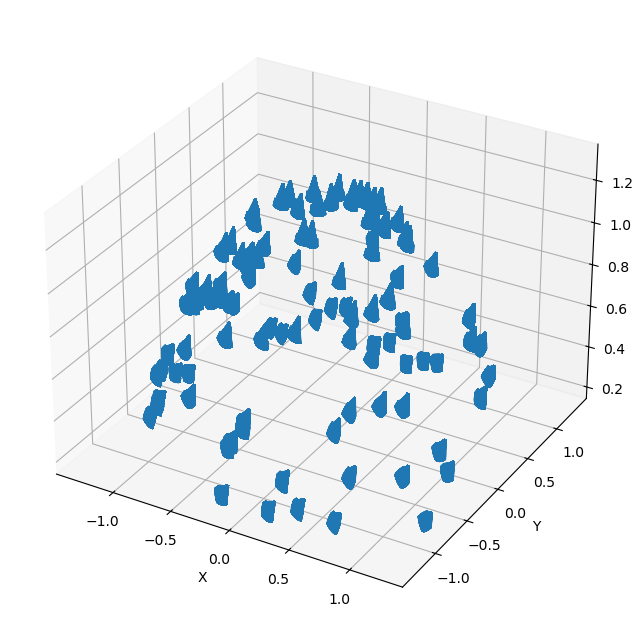

In [40]:
def plot_all_poses(poses):

    #############################  TODO 2.1 BEGIN  ############################
    origins = []
    directions = []
    for i in range(poses.shape[0]):
      w_R_c = poses[i][:3,:3].T
      w_T_c = poses[i][:3,-1]
      orig, dir = get_rays(height, width, intrinsics,w_R_c, w_T_c)
      origins.append(orig)
      directions.append(dir)
    origins = torch.stack(origins).cpu() #Convert list to Tensor
    directions = torch.stack(directions).cpu()

    #############################  TODO 2.1 END  ############################

    print(origins.shape)
    ax = plt.figure(figsize=(12, 8)).add_subplot(projection='3d')
    _ = ax.quiver(origins[..., 0].flatten(),
                  origins[..., 1].flatten(),
                  origins[..., 2].flatten(),
                  directions[..., 0].flatten(),
                  directions[..., 1].flatten(),
                  directions[..., 2].flatten(), length=0.12, normalize=True)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('z')
    plt.show()

plot_all_poses(data['poses'])

2.2 Complete the following function to implement the sampling of points along a given ray.

In [41]:
def stratified_sampling(ray_origins, ray_directions, near, far, samples):

    """
    Sample 3D points on the given rays. The near and far variables indicate the bounds of sampling range.

    Args:
    ray_origins: Origin of each ray in the "bundle" as returned by the
      get_rays() function. Shape: (height, width, 3).
    ray_directions: Direction of each ray in the "bundle" as returned by the
      get_rays() function. Shape: (height, width, 3).
    near: The 'near' extent of the bounding volume.
    far:  The 'far' extent of the bounding volume.
    samples: Number of samples to be drawn along each ray.

    Returns:
    ray_points: Query 3D points along each ray. Shape: (height, width, samples, 3).
    depth_points: Sampled depth values along each ray. Shape: (height, width, samples).
    """

    #############################  TODO 2.2 BEGIN  ############################
    height, width, _ = ray_origins.shape

    # Compute the depth values
    depth_range = far - near
    sample_indices = torch.arange(samples, dtype=torch.float32) - 1
    sample_ratios = sample_indices / samples
    depth_values = depth_range * sample_ratios + near

    # find ray origins, ray directions
    ray_origins = ray_origins.reshape(height, width, 1, 3)
    ray_directions = ray_directions.reshape(height, width, 1, 3)

    # find depth_points, ray points
    depth_points = torch.broadcast_to(depth_values, (height, width, samples)).to(device)
    ray_points = ray_origins + depth_points.reshape((height, width, samples, 1)) * ray_directions

    #############################  TODO 2.2 END  ############################
    return ray_points, depth_points

In [42]:
len(poses)
H, W,_ , _ = images.shape
R = poses[0][:3, :3]
T = poses[0][:3, -1]
samples = 64
display = 25
near = 0.667
far = 2
ray_o, ray_dir = get_rays(H, W, intrinsics, R, T)

ray_pt, depth_pt = stratified_sampling(ray_o, ray_dir, near, far, samples)

ray_pt.shape

torch.Size([100, 100, 64, 3])

2.3 Define the network architecture of NeRF along with a function that divided data into chunks to avoid memory leaks during training.

In [43]:
class nerf_model(nn.Module):

    """
    Define a NeRF model comprising eight fully connected layers and following the
    architecture described in the NeRF paper.
    """

    def __init__(self, filter_size=256, num_x_frequencies=6, num_d_frequencies=3):
        super().__init__()

        #############################  TODO 2.3 BEGIN  ############################
        # for autograder compliance, please follow the given naming for your layers
        self.input_dim_x = 2*(3*num_x_frequencies) + 3
        self.input_dim_d = 2*(3*num_d_frequencies) + 3
        self.layers = nn.ModuleDict({
            'layer_1': nn.Linear(in_features= self.input_dim_x, out_features=filter_size),
            'layer_2': nn.Linear(in_features= filter_size, out_features=filter_size),
            'layer_3': nn.Linear(in_features= filter_size, out_features=filter_size),
            'layer_4': nn.Linear(in_features= filter_size, out_features=filter_size),
            'layer_5': nn.Linear(in_features= filter_size, out_features=filter_size),
            'layer_6': nn.Linear(in_features= filter_size + 2*3*num_x_frequencies + 3, out_features=filter_size),
            'layer_7': nn.Linear(in_features= filter_size, out_features=filter_size),
            'layer_8': nn.Linear(in_features= filter_size, out_features=filter_size),
            'layer_s': nn.Linear(in_features= filter_size, out_features=1),
            'layer_9': nn.Linear(in_features= filter_size, out_features=filter_size),
            'layer_10': nn.Linear(in_features= filter_size + self.input_dim_d, out_features=128),
            'layer_11': nn.Linear(in_features= 128, out_features=3)
        })

        #############################  TODO 2.3 END  ############################


    def forward(self, x, d):
        #############################  TODO 2.3 BEGIN  ############################
        # example of forward through a layer: y = self.layers['layer_1'](x)

        l1_out = torch.relu(self.layers['layer_1'](x))
        l2_out = torch.relu(self.layers['layer_2'](l1_out))
        l3_out = torch.relu(self.layers['layer_3'](l2_out))
        l4_out = torch.relu(self.layers['layer_4'](l3_out))
        l5_out = torch.relu(self.layers['layer_5'](l4_out))

        l6_out = torch.relu(self.layers['layer_6'](torch.cat([l5_out, x], dim=-1)))
        l7_out = torch.relu(self.layers['layer_7'](l6_out))
        l8_out = torch.relu(self.layers['layer_8'](l7_out))
        sigma = self.layers['layer_s'](l8_out)
        l9_out = self.layers['layer_9'](l8_out)


        l10_out = torch.relu(self.layers['layer_10'](torch.cat([l9_out, d], dim= -1)))
        rgb = torch.sigmoid(self.layers['layer_11'](l10_out))
        #############################  TODO 2.3 END  ############################
        return rgb, sigma

In [44]:
def get_batches(ray_points, ray_directions, num_x_frequencies, num_d_frequencies):

    def get_chunks(inputs, chunksize = 2**15):
        """
        This fuction gets an array/list as input and returns a list of chunks of the initial array/list
        """
        return [inputs[i:i + chunksize] for i in range(0, inputs.shape[0], chunksize)]

    """
    This function returns chunks of the ray points and directions to avoid memory errors with the
    neural network. It also applies positional encoding to the input points and directions before
    dividing them into chunks, as well as normalizing and populating the directions.
    """
    #############################  TODO 2.3 BEGIN  ############################
    ray_directions_norm = ray_directions / torch.norm(ray_directions, dim=-1, keepdim=True)

    # repeat directions for every point
    ray_directions_pop = ray_directions_norm.unsqueeze(-2).repeat(1, 1, ray_points.shape[2], 1)

    # flatten vectors
    ray_points_flat = ray_points.view(-1, 3) #(H * W * N of samples, 3)
    ray_directions_flat = ray_directions_pop.view(-1, 3) #(H * W * N of samples, 3)

    # Apply positional encoding:
    en_ray_directions_flat = positional_encoding(ray_directions_flat, num_d_frequencies)
    en_ray_points_flat = positional_encoding(ray_points_flat, num_x_frequencies)

    # Call get_chunks:
    ray_points_batches = get_chunks(en_ray_points_flat)
    ray_directions_batches = get_chunks(en_ray_directions_flat)
    #############################  TODO 2.3 END  ############################

    return ray_points_batches, ray_directions_batches

2.4 Compute the compositing weights of samples on camera ray and then complete the volumetric rendering procedure to reconstruct a whole RGB image from the sampled points and the outputs of the neural network.

In [45]:
def volumetric_rendering(rgb, s, depth_points):

    """
    Differentiably renders a radiance field, given the origin of each ray in the
    "bundle", and the sampled depth values along them.

    Args:
    rgb: RGB color at each query location (X, Y, Z). Shape: (height, width, samples, 3).
    sigma: Volume density at each query location (X, Y, Z). Shape: (height, width, samples).
    depth_points: Sampled depth values along each ray. Shape: (height, width, samples).

    Returns:
    rec_image: The reconstructed image after applying the volumetric rendering to every pixel.
    Shape: (height, width, 3)
    """

    device = "cuda"
    #############################  TODO 2.4 BEGIN  ############################
    rgb = rgb.to(device)
    s = s.to(device)
    delta_i = 1e9*torch.ones_like(depth_points).to(device)
    delta_i[:, :, :-1] = torch.diff(depth_points, dim=-1)
    sigma_i = -F.relu(s)*delta_i
    T_i = torch.cumprod(torch.exp(sigma_i), dim=-1)
    T_i = torch.roll(T_i, 1, dims=-1)
    AdjSigmaDel_i = 1 - torch.exp(sigma_i)
    rec_image = ((T_i * AdjSigmaDel_i)[..., None] * rgb).sum(dim=-2)
    #############################  TODO 2.4 END  ############################

    return rec_image

To test and visualize your implementation, independently of the previous and next steps of the
NeRF pipeline, you can load the sanity_volumentric.pt file, run your implementation of the volumetric function and expect to see the figure provided in the handout.


In [46]:
url = "https://drive.google.com/file/d/1ag6MqSh3h4KY10Mcx5fKxt9roGNLLILK/view?usp=sharing"
gdown.download(url=url, output='sanity_volumentric.pt', quiet=False, fuzzy=True)
rbd = torch.load('sanity_volumentric.pt')

Downloading...
From (uriginal): https://drive.google.com/uc?id=1ag6MqSh3h4KY10Mcx5fKxt9roGNLLILK
From (redirected): https://drive.google.com/uc?id=1ag6MqSh3h4KY10Mcx5fKxt9roGNLLILK&confirm=t&uuid=d48fb8e9-159b-4558-a783-8cc90bf0988f
To: /home/ubuntu/sanity_volumentric.pt
100%|██████████| 120M/120M [00:02<00:00, 47.5MB/s] 


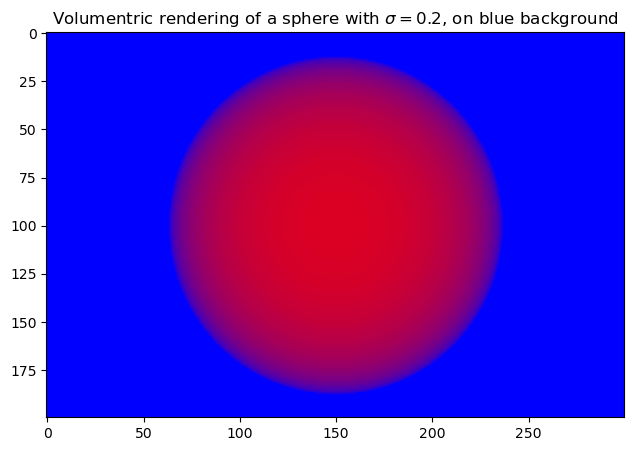

In [47]:
r = rbd['rgb']
s = rbd['sigma']
depth_points = rbd['depth_points']
rec_image = volumetric_rendering(r, s, depth_points)

plt.figure(figsize=(10, 5))
plt.imshow(rec_image.detach().cpu().numpy())
plt.title(f'Volumentric rendering of a sphere with $\\sigma={0.2}$, on blue background')
plt.show()

2.5 Combine everything together. Given the pose position of a camera, compute the camera rays and sample the 3D points along these rays. Divide those points into batches and feed them to the neural network. Concatenate them and use them for the volumetric rendering to reconstructed the final image.

In [48]:
def one_forward_pass(height, width, intrinsics, pose, near, far, samples, model, num_x_frequencies, num_d_frequencies):

    #############################  TODO 2.5 BEGIN  ############################


    #compute all the rays from the image
    R, T = pose[:3, :3] , pose[:3, -1].reshape(-1, 1)
    ray_origins, ray_directions = get_rays(height,width, intrinsics, R, T)

    #sample the points from the rays
    ray_points, depth_points = stratified_sampling(ray_origins, ray_directions, near, far, samples)
    # pdb.set_trace()
    #divide data into batches to avoid memory errors
    ray_points_batches, ray_directions_batches = get_batches(ray_points, ray_directions, num_x_frequencies, num_d_frequencies)

    #forward pass the batches and concatenate the outputs at the end
    rgb_list = []
    s_list = []
    for i in range(len(ray_points_batches)):
      rgb_i, s_i = model(ray_points_batches[i].to(device), ray_directions_batches[i].to(device))
      # print(f"RGB ={rgb_i.shape}, S = {s_i.shape}")
      rgb_list.append(rgb_i)
      s_list.append(s_i)

    # pdb.set_trace()
    rgb = torch.cat(rgb_list, dim = 0).reshape(height, width, samples, 3)
    s = torch.vstack(s_list).reshape(height, width, samples)
    # Apply volumetric rendering to obtain the reconstructed image
    rec_image = volumetric_rendering(rgb, s, depth_points)

    #############################  TODO 2.5 END  ############################

    return rec_image

If you manage to pass the autograder for all the previous functions, then it is time to train a NeRF! We provide the hyperparameters for you, we initialize the NeRF model and its weights, and we define a couple lists that will be needed to store results.

In [49]:
num_x_frequencies = 10
num_d_frequencies = 4
learning_rate  = 5e-4
iterations = 3000
samples = 64
display = 25
near = 0.667
far = 2

model = nerf_model(num_x_frequencies=num_x_frequencies,num_d_frequencies=num_d_frequencies).to(device)

def weights_init(m):
    if isinstance(m, torch.nn.Linear):
        torch.nn.init.xavier_uniform_(m.weight)
model.apply(weights_init)

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

criterion = nn.MSELoss()
psnrs = []
iternums = []

t = time.time()
t0 = time.time()

In [50]:
print(images.shape)
N = images.shape[0]

torch.Size([100, 100, 100, 3])


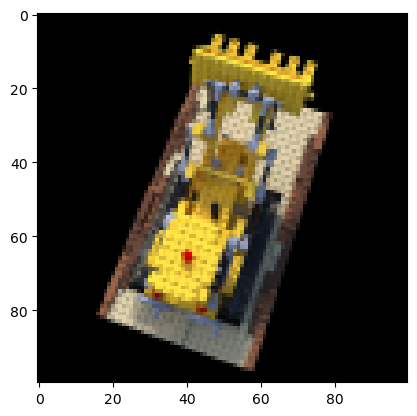

In [51]:
t = torch.randint(0, 100, (1,)).item()

image = images[t]
plt.imshow(image.detach().cpu().numpy())

In [54]:
from torchsummary import summary
pose = poses[0]
R = pose[:3, :3]
T = pose[:3, -1]
ray_origins, ray_dirs = get_rays(height, width, intrinsics, R, T)
points, depths = stratified_sampling(ray_origins, ray_dirs, near, far, samples)
pt_ray_batch, dir_ray_batch = get_batches(points, ray_dirs, num_x_frequencies, num_d_frequencies)

print(pt_ray_batch[0].shape)
summary(model, [(32768,63), (32768, 27)], 20)

torch.Size([32768, 63])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1           [20, 32768, 256]          16,384
            Linear-2           [20, 32768, 256]          65,792
            Linear-3           [20, 32768, 256]          65,792
            Linear-4           [20, 32768, 256]          65,792
            Linear-5           [20, 32768, 256]          65,792
            Linear-6           [20, 32768, 256]          81,920
            Linear-7           [20, 32768, 256]          65,792
            Linear-8           [20, 32768, 256]          65,792
            Linear-9             [20, 32768, 1]             257
           Linear-10           [20, 32768, 256]          65,792
           Linear-11           [20, 32768, 128]          36,352
           Linear-12             [20, 32768, 3]             387
Total params: 595,844
Trainable params: 595,844
Non-trainable params: 0
-------

Iteration 0  Loss: 0.0348  PSNR: 14.59  Time: 3.06 secs per iter,  1.32 mins in total


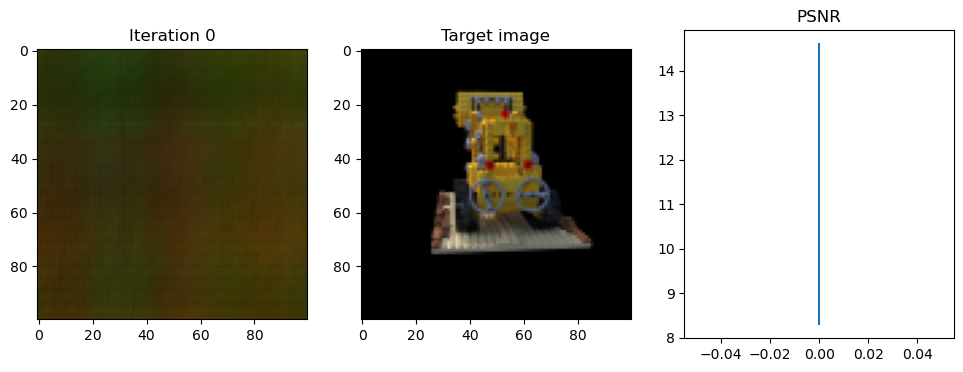

Iteration 25  Loss: 0.1036  PSNR: 9.85  Time: 1.19 secs per iter,  1.81 mins in total


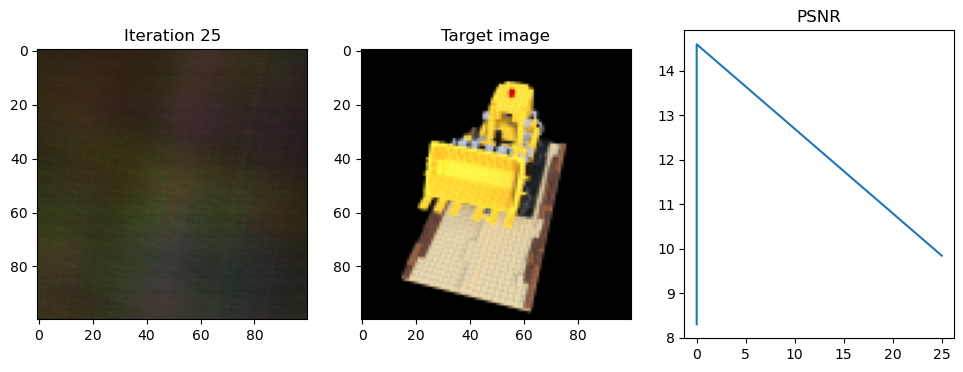

Iteration 50  Loss: 0.0227  PSNR: 16.44  Time: 1.20 secs per iter,  2.32 mins in total


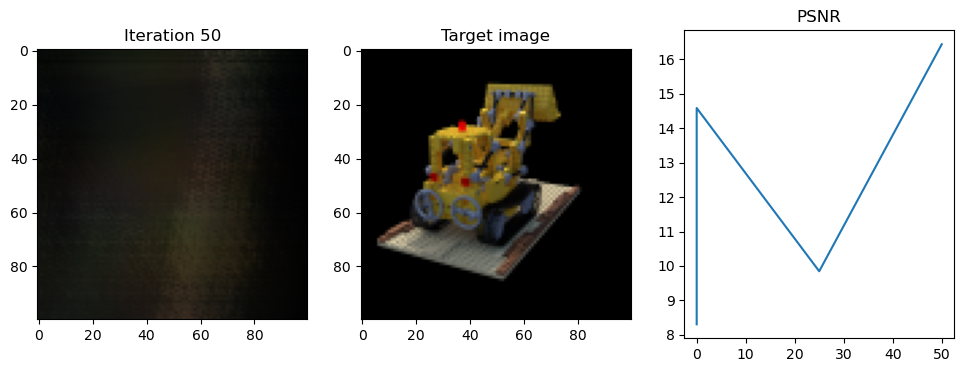

Iteration 75  Loss: 0.0539  PSNR: 12.69  Time: 1.21 secs per iter,  2.82 mins in total


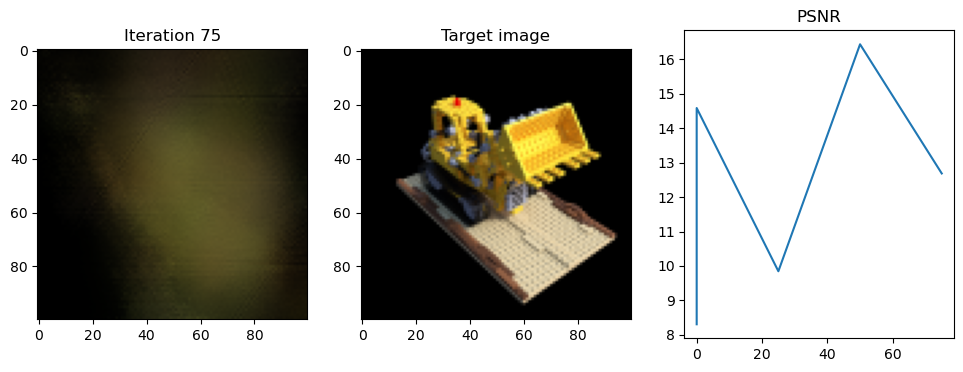

Iteration 100  Loss: 0.0429  PSNR: 13.67  Time: 1.18 secs per iter,  3.31 mins in total


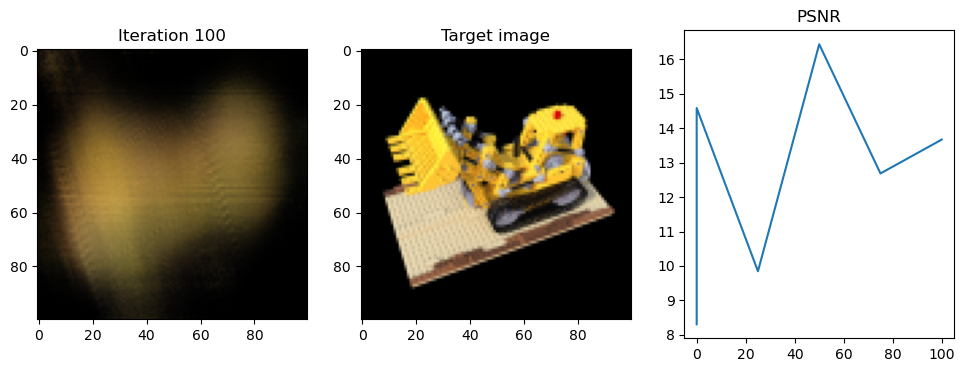

Iteration 125  Loss: 0.0230  PSNR: 16.38  Time: 1.18 secs per iter,  3.80 mins in total


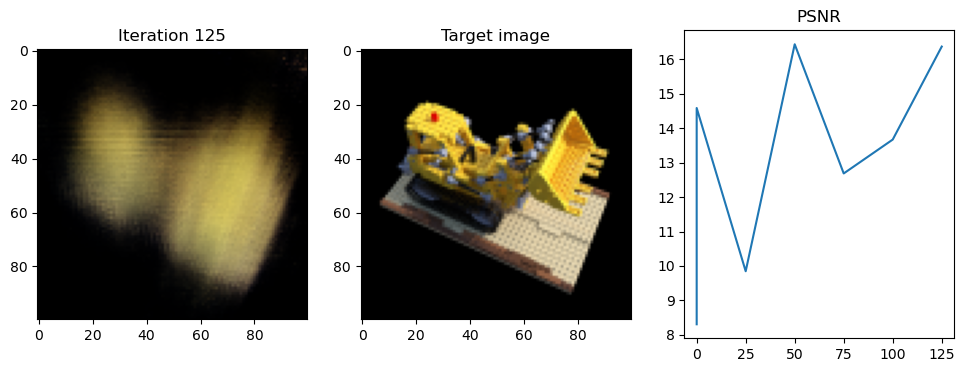

Iteration 150  Loss: 0.0400  PSNR: 13.98  Time: 1.18 secs per iter,  4.29 mins in total


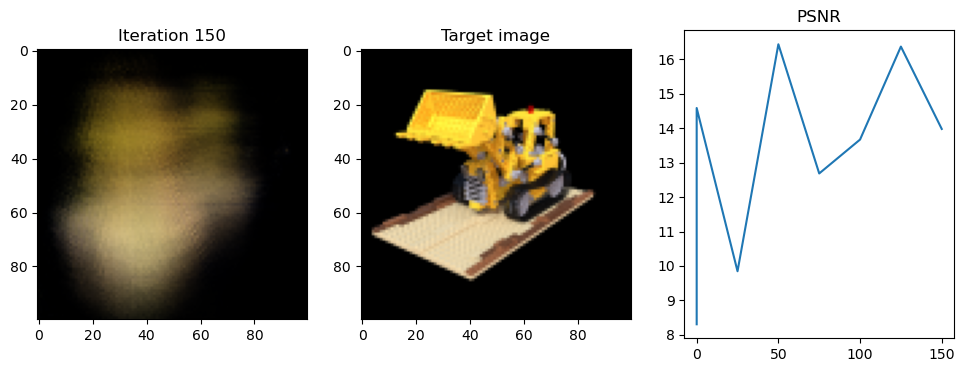

Iteration 175  Loss: 0.0274  PSNR: 15.63  Time: 1.19 secs per iter,  4.79 mins in total


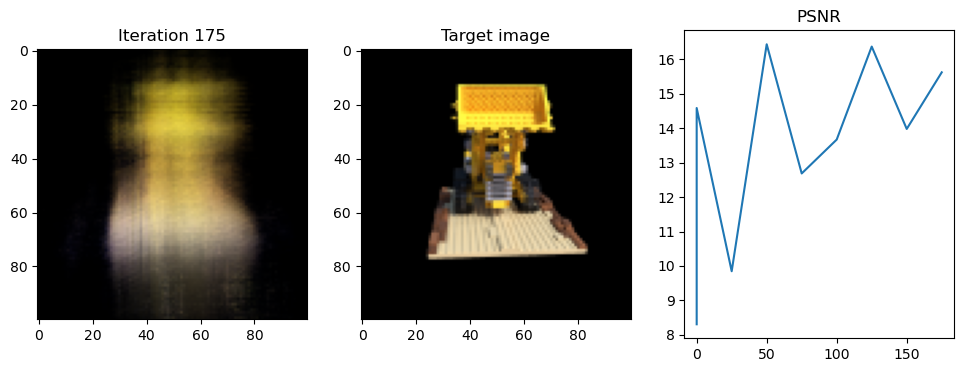

Iteration 200  Loss: 0.0084  PSNR: 20.76  Time: 1.19 secs per iter,  5.28 mins in total


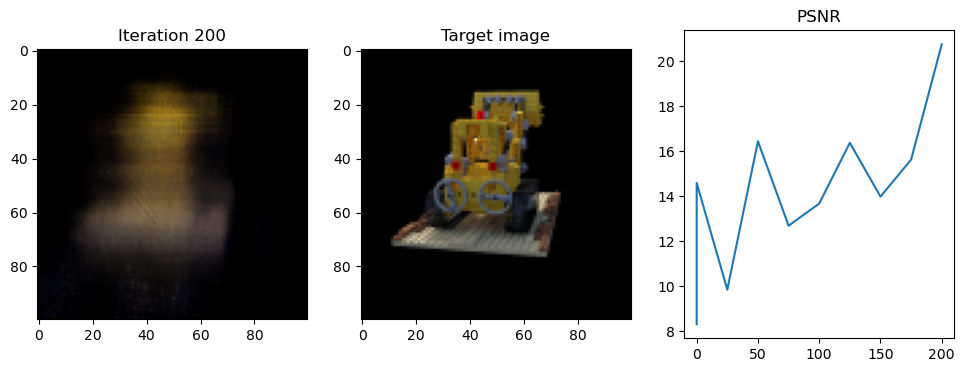

Iteration 225  Loss: 0.0169  PSNR: 17.73  Time: 1.18 secs per iter,  5.78 mins in total


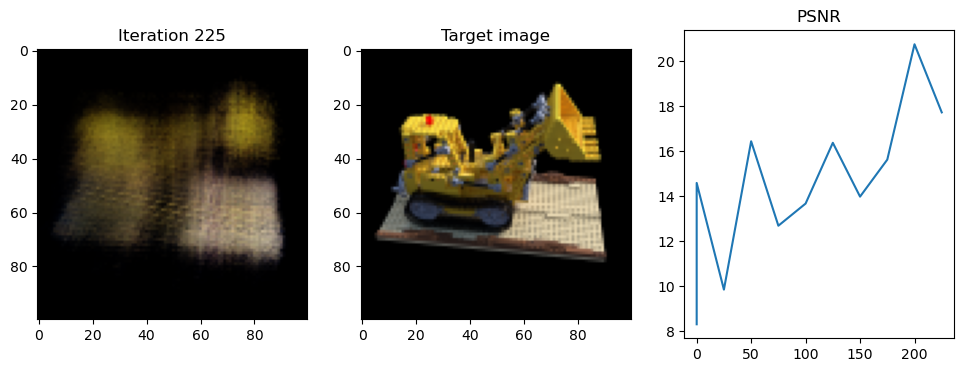

Iteration 250  Loss: 0.0141  PSNR: 18.50  Time: 1.18 secs per iter,  6.27 mins in total


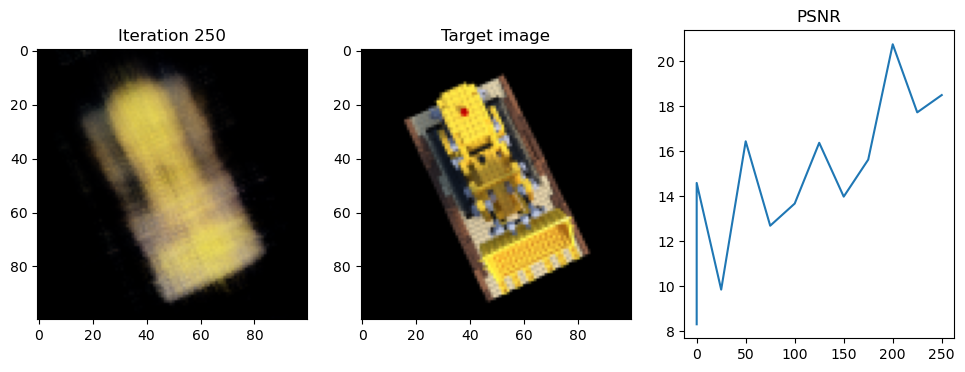

Iteration 275  Loss: 0.0212  PSNR: 16.74  Time: 1.18 secs per iter,  6.76 mins in total


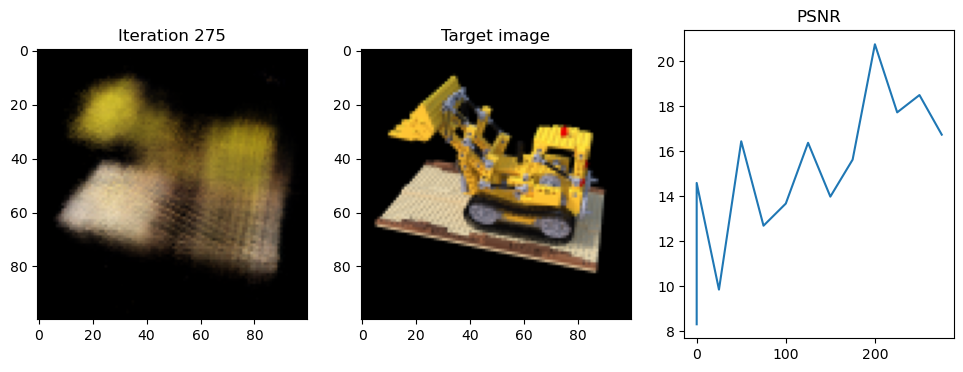

Iteration 300  Loss: 0.0118  PSNR: 19.28  Time: 1.19 secs per iter,  7.26 mins in total


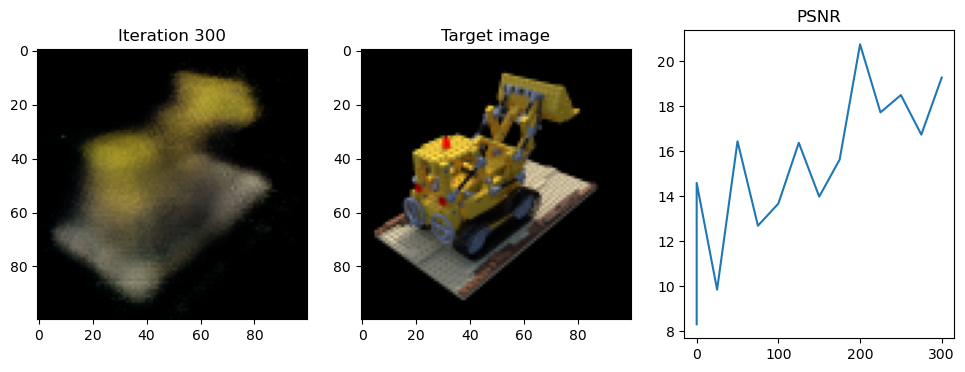

Iteration 325  Loss: 0.0169  PSNR: 17.71  Time: 1.18 secs per iter,  7.75 mins in total


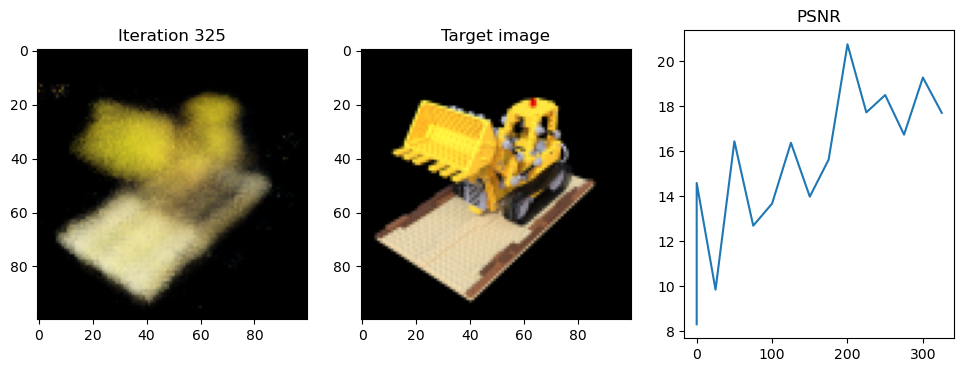

Iteration 350  Loss: 0.0098  PSNR: 20.08  Time: 1.18 secs per iter,  8.24 mins in total


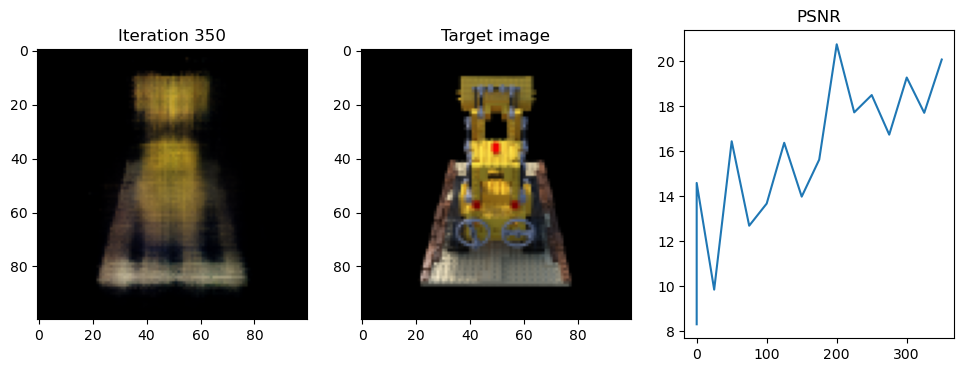

Iteration 375  Loss: 0.0099  PSNR: 20.06  Time: 1.18 secs per iter,  8.73 mins in total


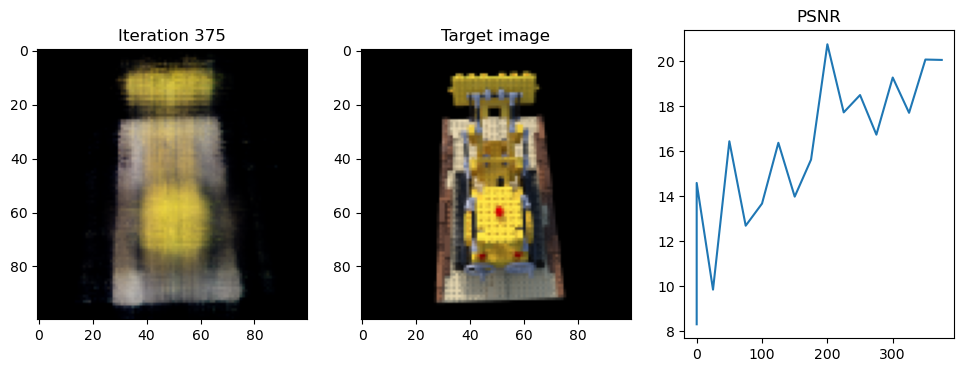

Iteration 400  Loss: 0.0133  PSNR: 18.76  Time: 1.18 secs per iter,  9.23 mins in total


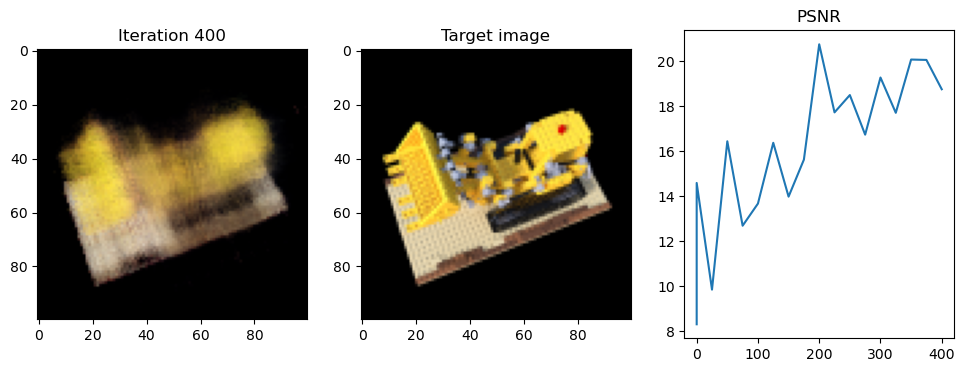

Iteration 425  Loss: 0.0100  PSNR: 19.99  Time: 1.18 secs per iter,  9.72 mins in total


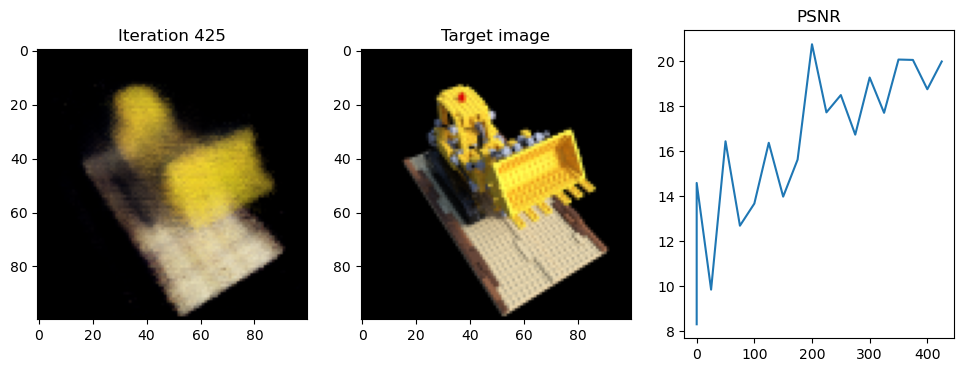

Iteration 450  Loss: 0.0114  PSNR: 19.44  Time: 1.18 secs per iter,  10.21 mins in total


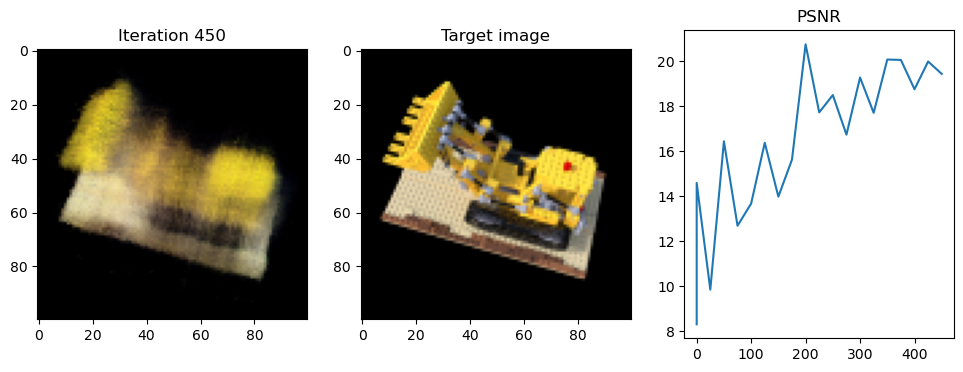

Iteration 475  Loss: 0.0112  PSNR: 19.50  Time: 1.18 secs per iter,  10.70 mins in total


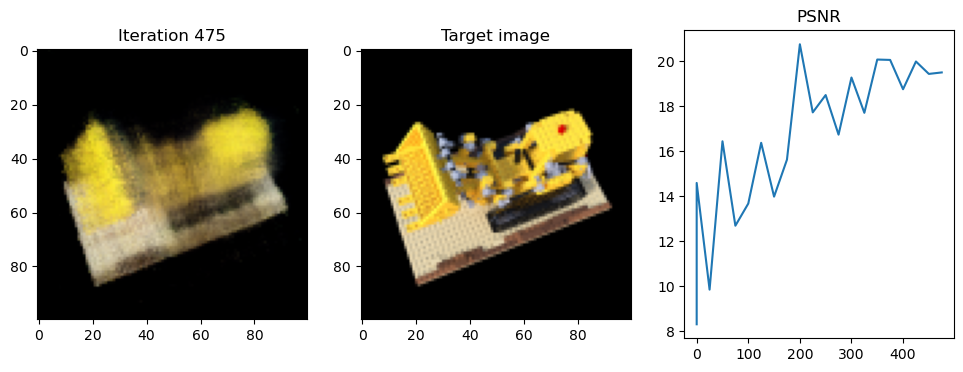

Iteration 500  Loss: 0.0123  PSNR: 19.10  Time: 1.18 secs per iter,  11.19 mins in total


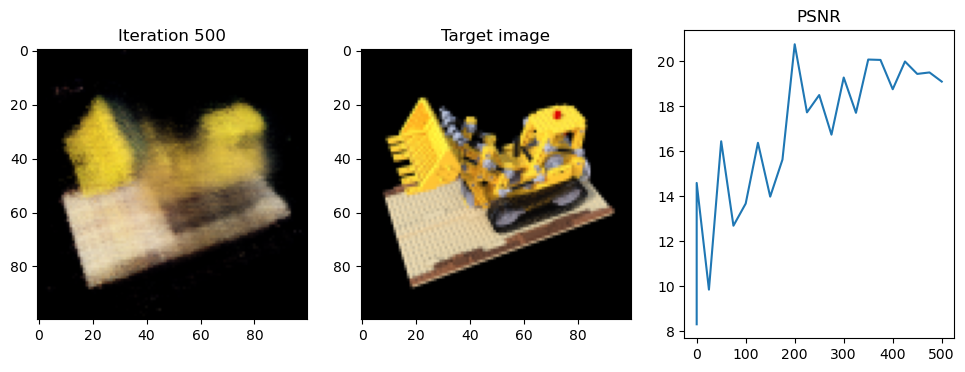

Iteration 525  Loss: 0.0051  PSNR: 22.96  Time: 1.18 secs per iter,  11.68 mins in total


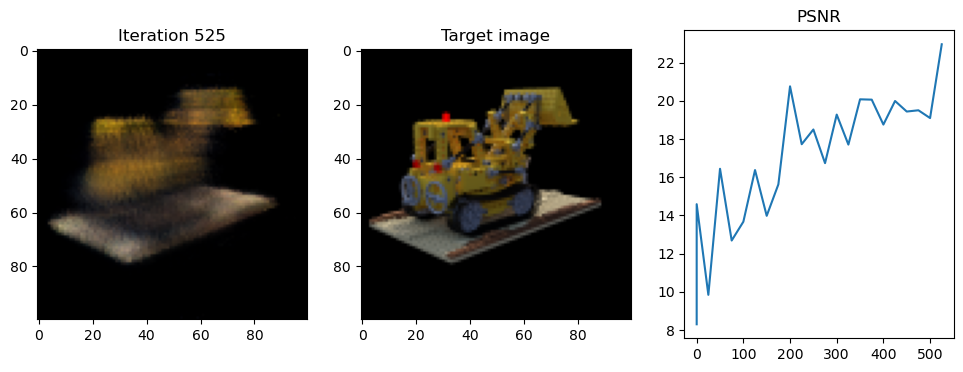

Iteration 550  Loss: 0.0070  PSNR: 21.57  Time: 1.18 secs per iter,  12.17 mins in total


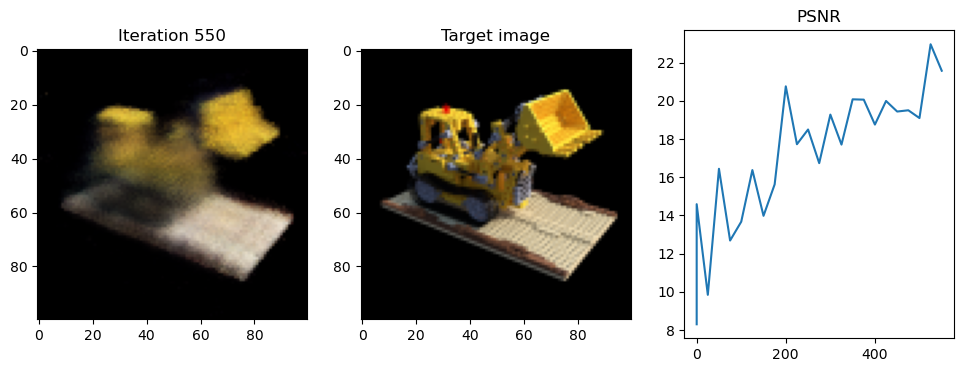

Iteration 575  Loss: 0.0055  PSNR: 22.63  Time: 1.18 secs per iter,  12.66 mins in total


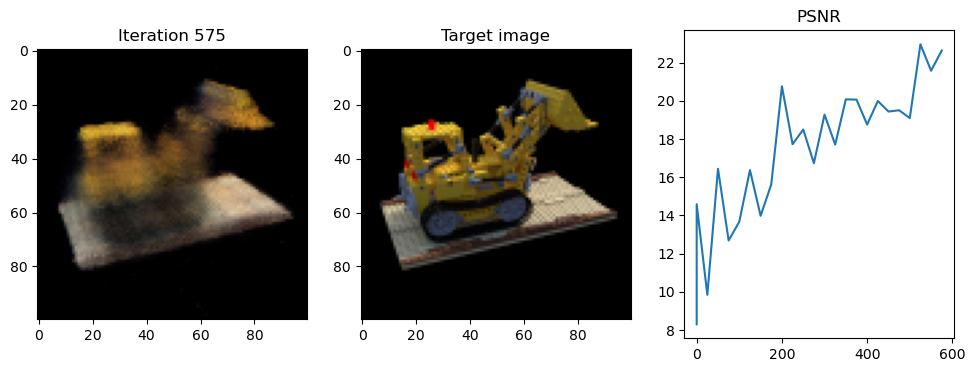

Iteration 600  Loss: 0.0044  PSNR: 23.56  Time: 1.18 secs per iter,  13.15 mins in total


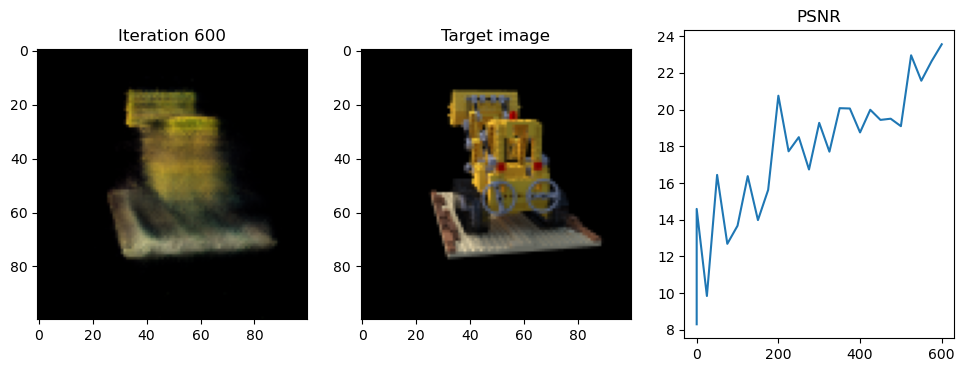

Iteration 625  Loss: 0.0060  PSNR: 22.21  Time: 1.19 secs per iter,  13.65 mins in total


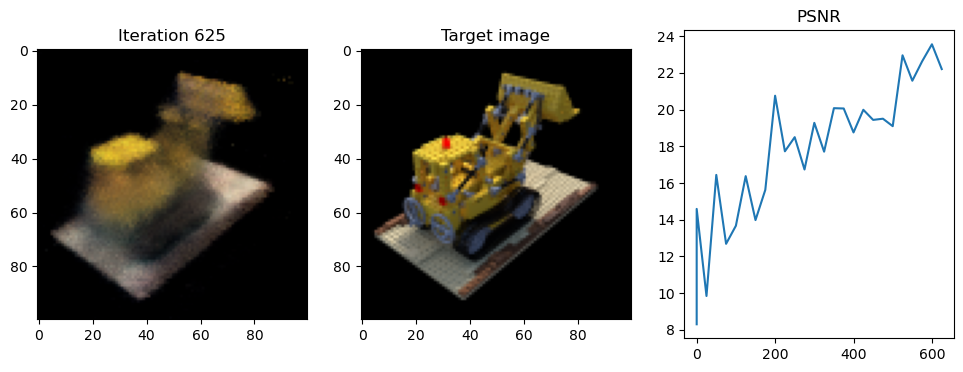

Iteration 650  Loss: 0.0107  PSNR: 19.71  Time: 1.18 secs per iter,  14.14 mins in total


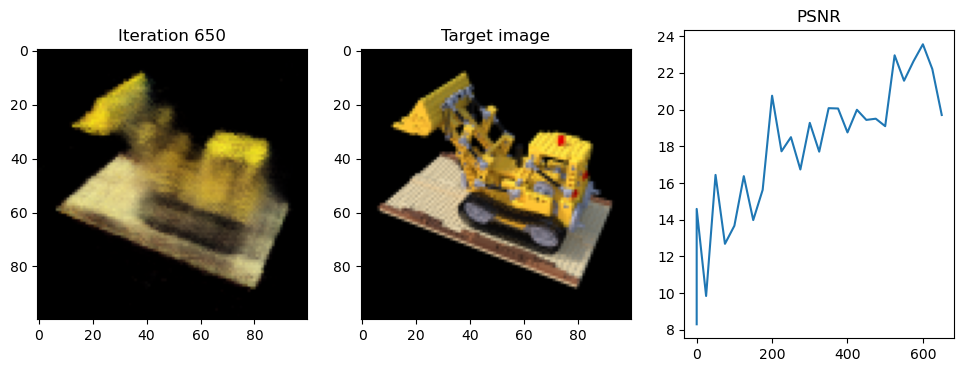

Iteration 675  Loss: 0.0088  PSNR: 20.54  Time: 1.18 secs per iter,  14.63 mins in total


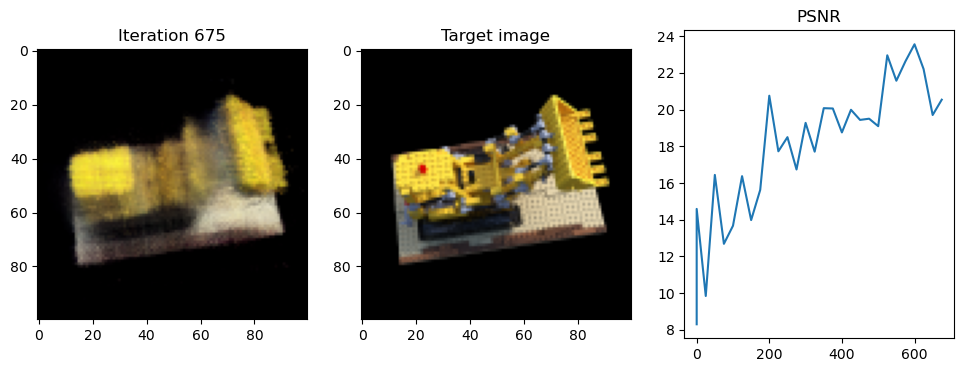

Iteration 700  Loss: 0.0051  PSNR: 22.92  Time: 1.18 secs per iter,  15.12 mins in total


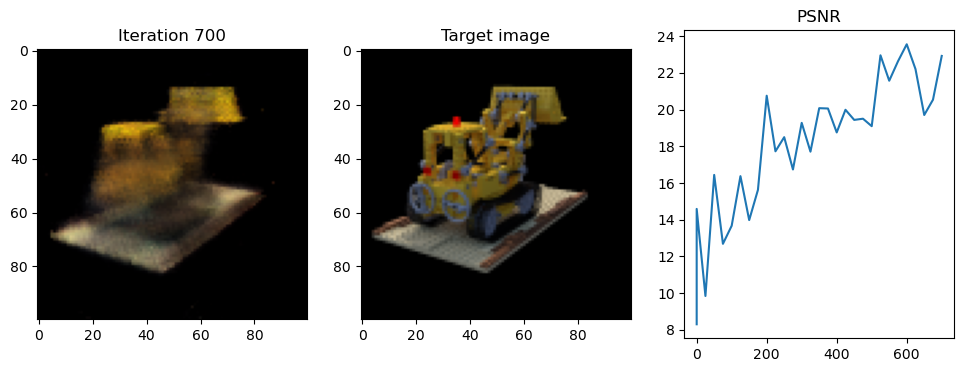

Iteration 725  Loss: 0.0088  PSNR: 20.53  Time: 1.18 secs per iter,  15.61 mins in total


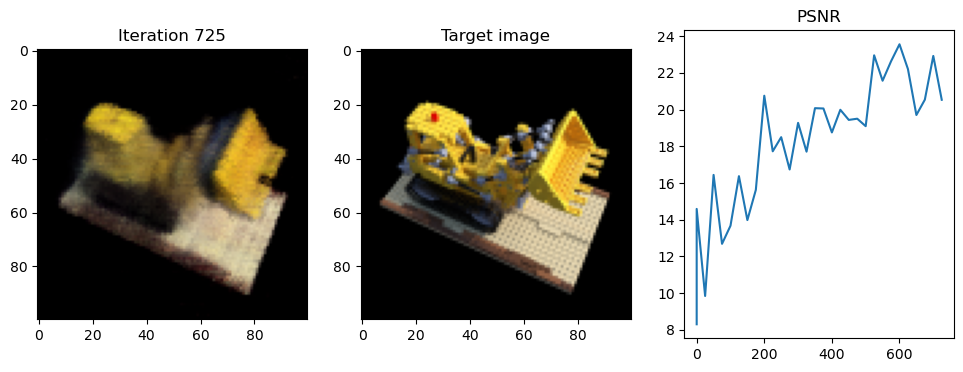

Iteration 750  Loss: 0.0079  PSNR: 21.00  Time: 1.18 secs per iter,  16.11 mins in total


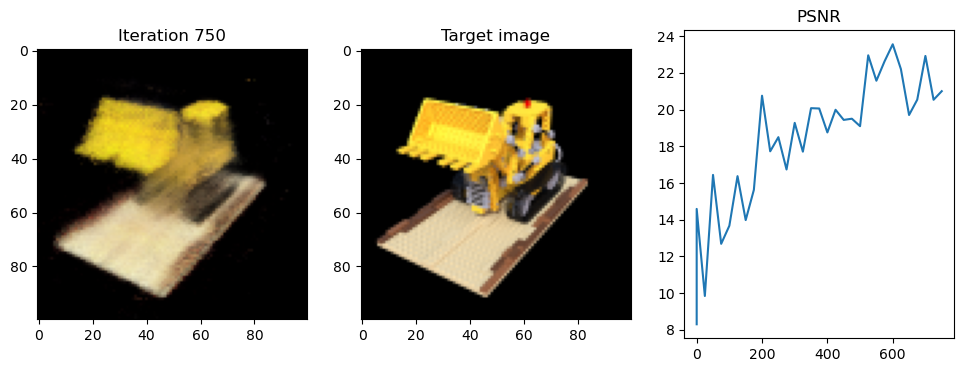

Iteration 775  Loss: 0.0076  PSNR: 21.17  Time: 1.18 secs per iter,  16.60 mins in total


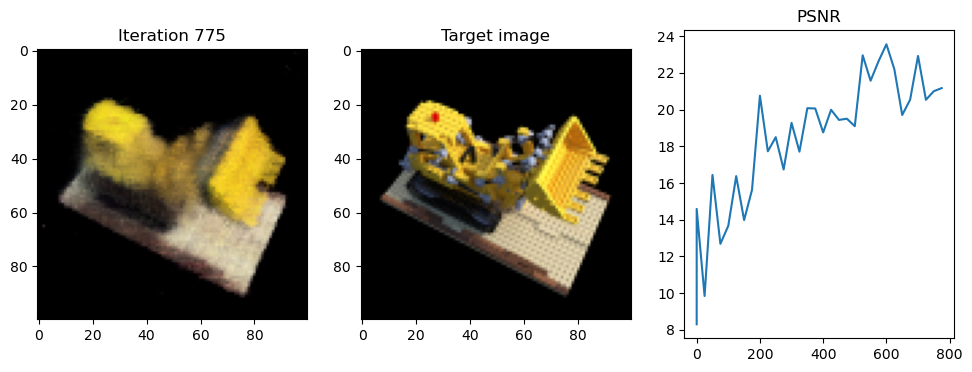

Iteration 800  Loss: 0.0054  PSNR: 22.69  Time: 1.18 secs per iter,  17.09 mins in total


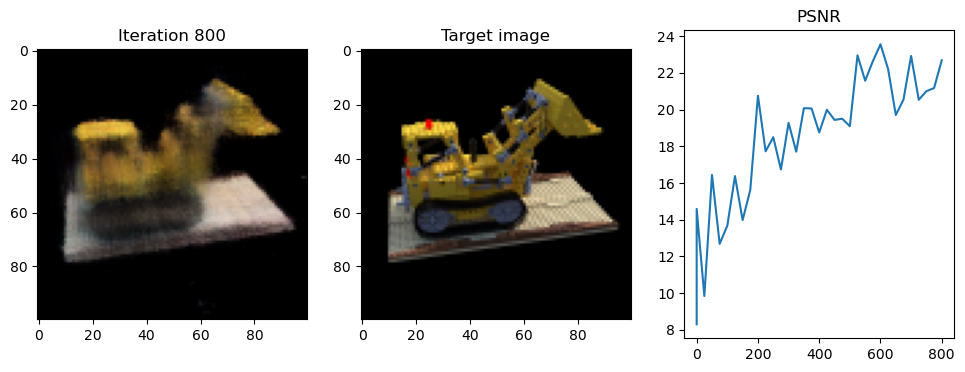

Iteration 825  Loss: 0.0062  PSNR: 22.10  Time: 1.18 secs per iter,  17.58 mins in total


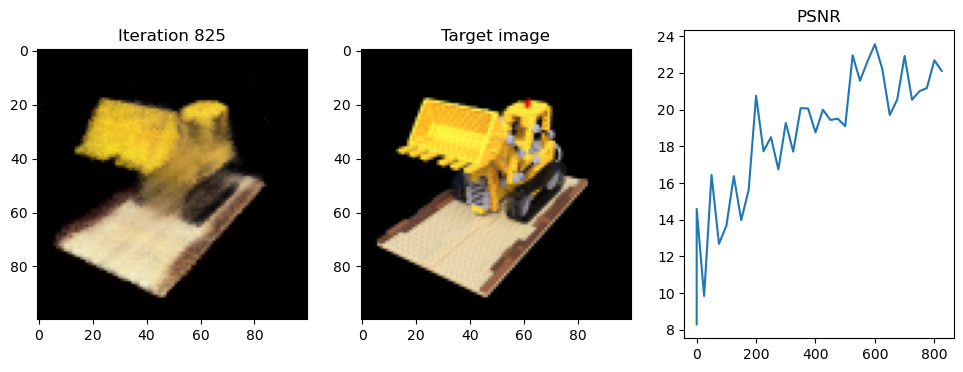

Iteration 850  Loss: 0.0061  PSNR: 22.16  Time: 1.19 secs per iter,  18.08 mins in total


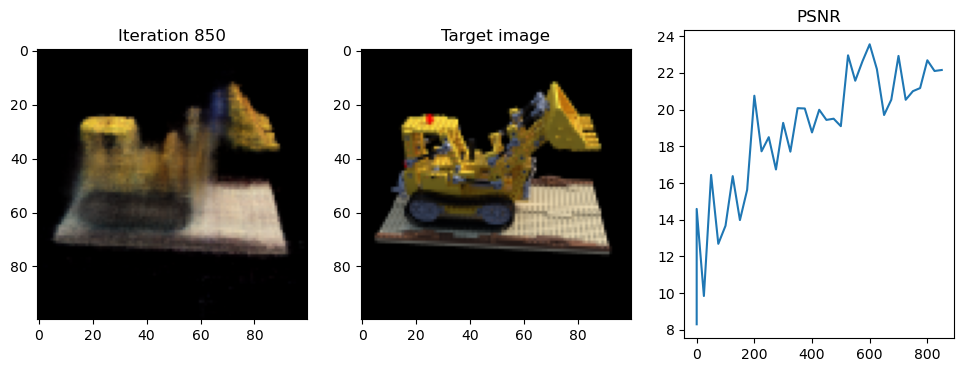

Iteration 875  Loss: 0.0078  PSNR: 21.07  Time: 1.18 secs per iter,  18.57 mins in total


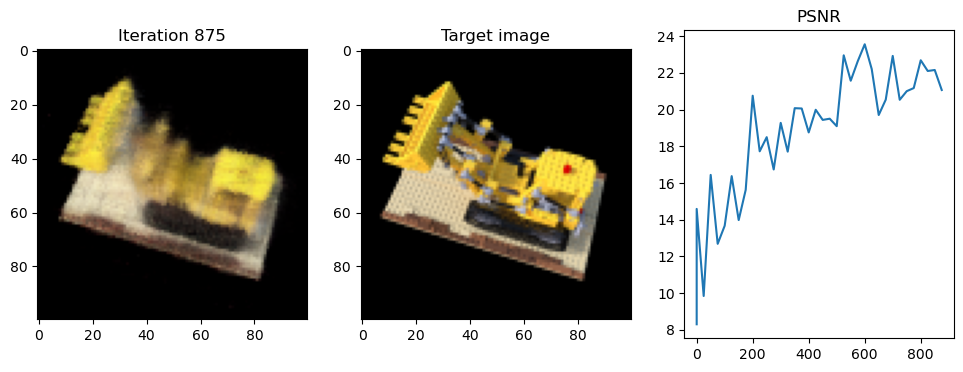

Iteration 900  Loss: 0.0049  PSNR: 23.11  Time: 1.18 secs per iter,  19.06 mins in total


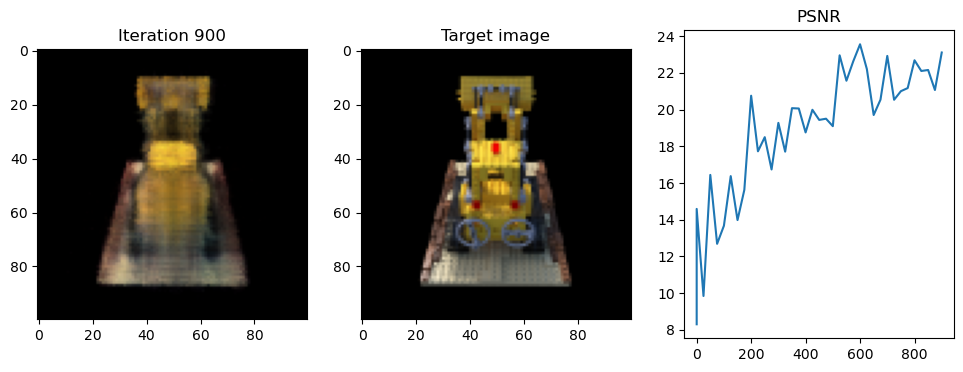

Iteration 925  Loss: 0.0029  PSNR: 25.42  Time: 1.18 secs per iter,  19.55 mins in total


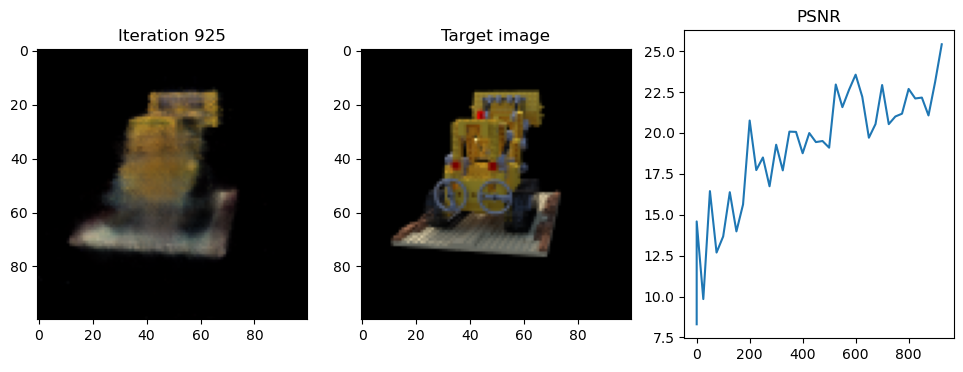

Iteration 950  Loss: 0.0065  PSNR: 21.89  Time: 1.19 secs per iter,  20.05 mins in total


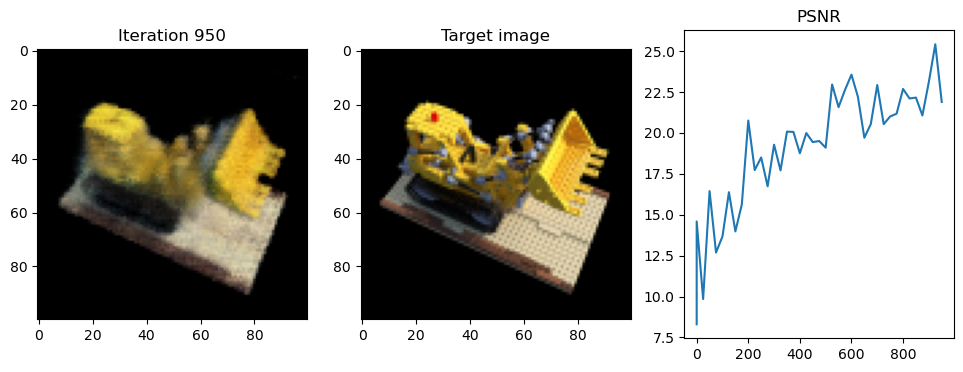

Iteration 975  Loss: 0.0041  PSNR: 23.86  Time: 1.18 secs per iter,  20.54 mins in total


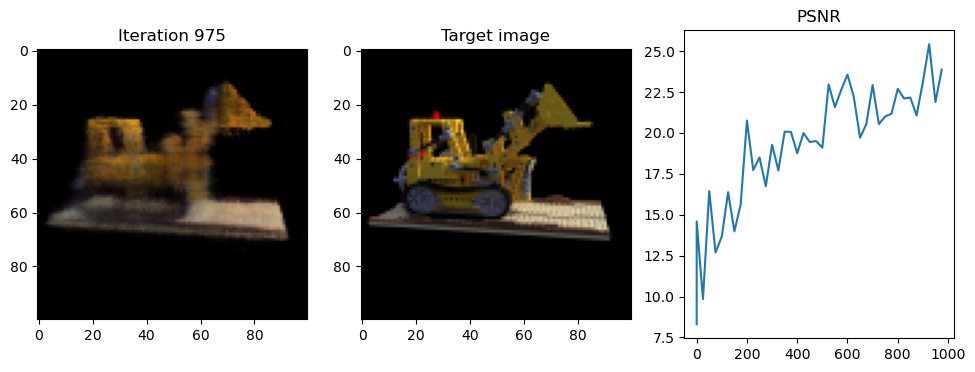

Iteration 1000  Loss: 0.0062  PSNR: 22.08  Time: 1.18 secs per iter,  21.03 mins in total


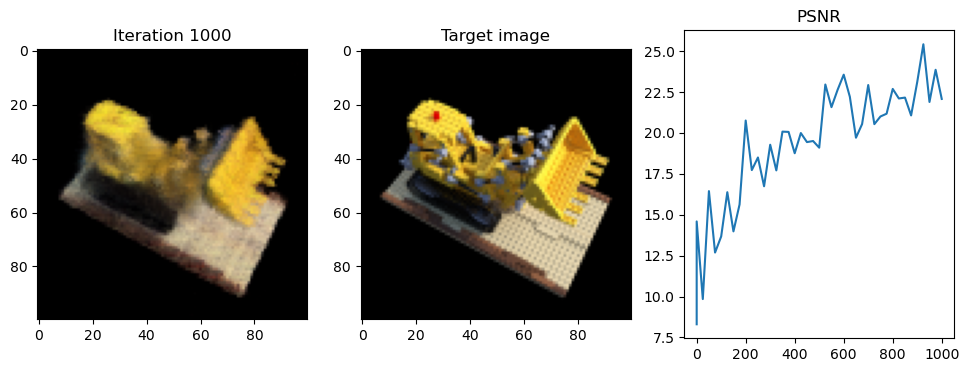

Iteration 1025  Loss: 0.0066  PSNR: 21.82  Time: 1.18 secs per iter,  21.52 mins in total


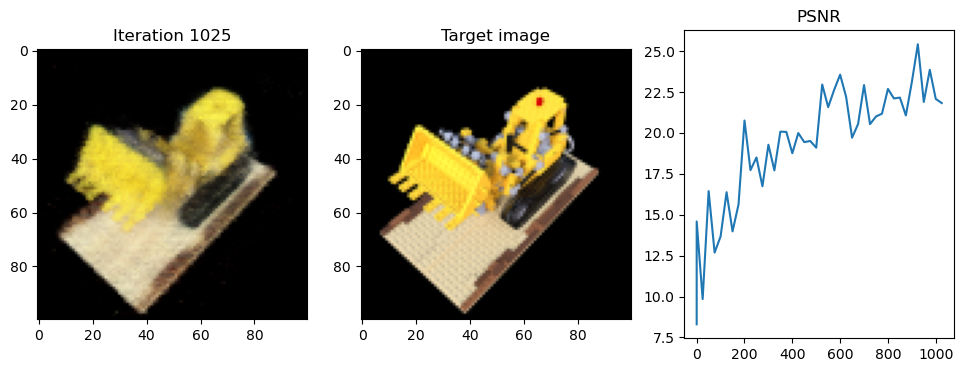

Iteration 1050  Loss: 0.0062  PSNR: 22.06  Time: 1.18 secs per iter,  22.01 mins in total


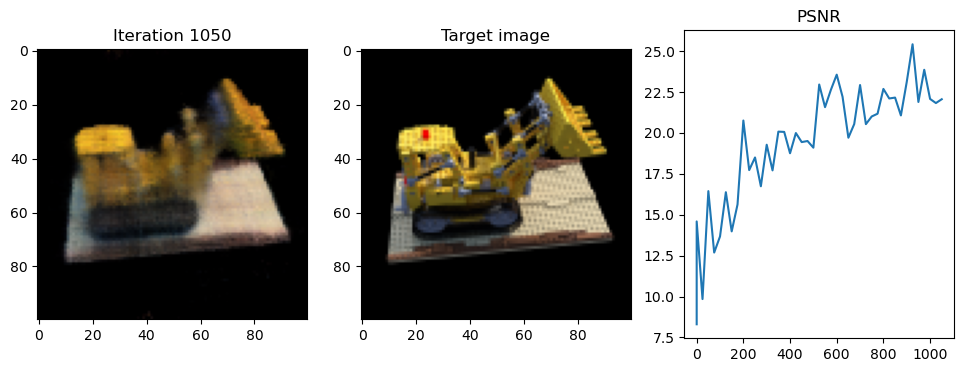

Iteration 1075  Loss: 0.0069  PSNR: 21.62  Time: 1.18 secs per iter,  22.50 mins in total


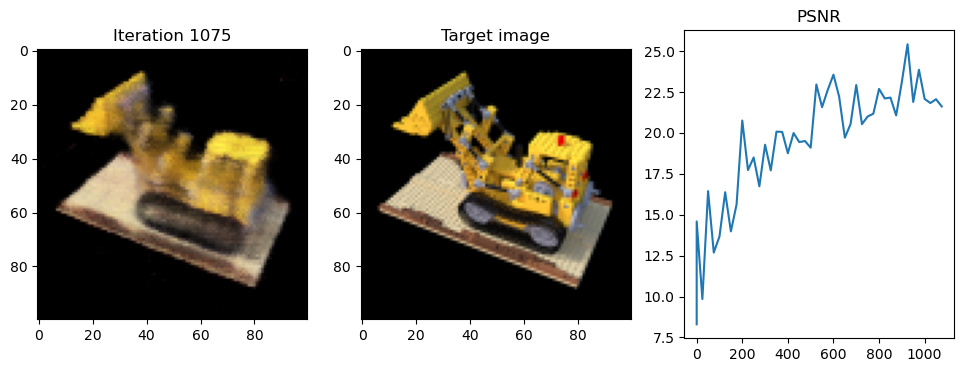

Iteration 1100  Loss: 0.0031  PSNR: 25.05  Time: 1.18 secs per iter,  23.00 mins in total


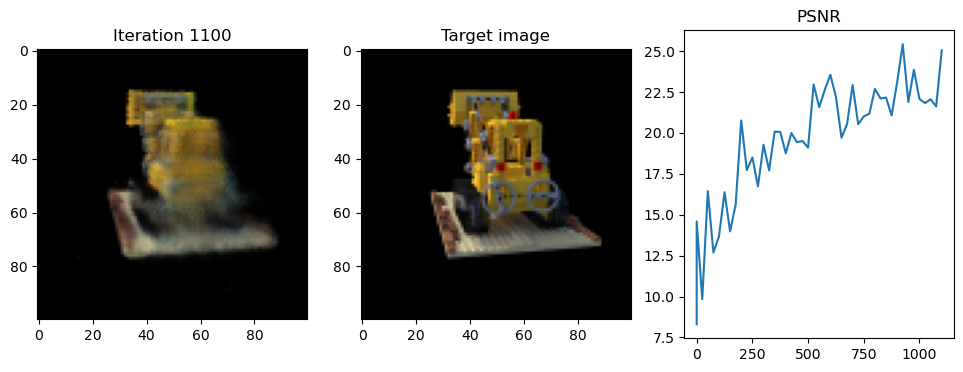

Iteration 1125  Loss: 0.0035  PSNR: 24.59  Time: 1.18 secs per iter,  23.49 mins in total


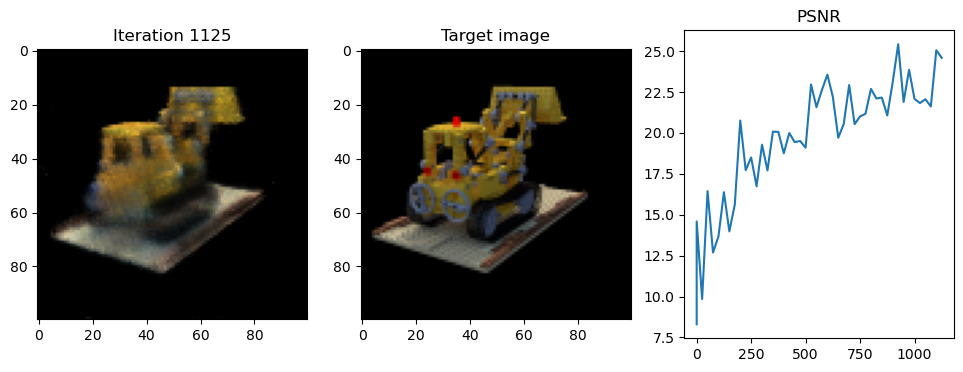

Iteration 1150  Loss: 0.0058  PSNR: 22.37  Time: 1.18 secs per iter,  23.98 mins in total


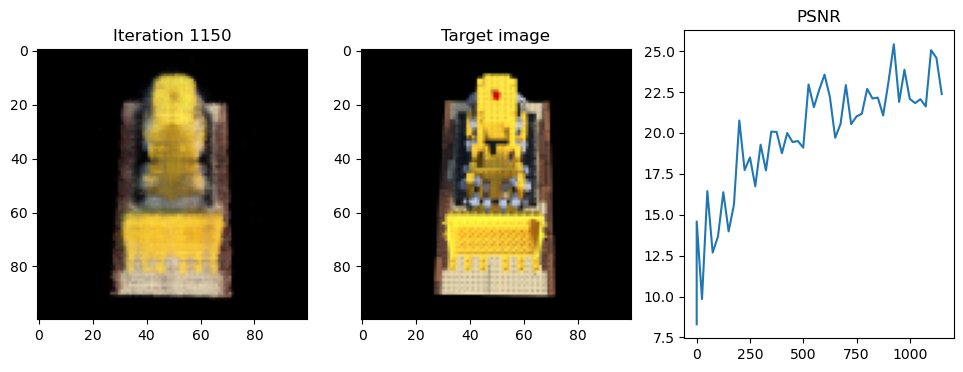

Iteration 1175  Loss: 0.0066  PSNR: 21.82  Time: 1.18 secs per iter,  24.47 mins in total


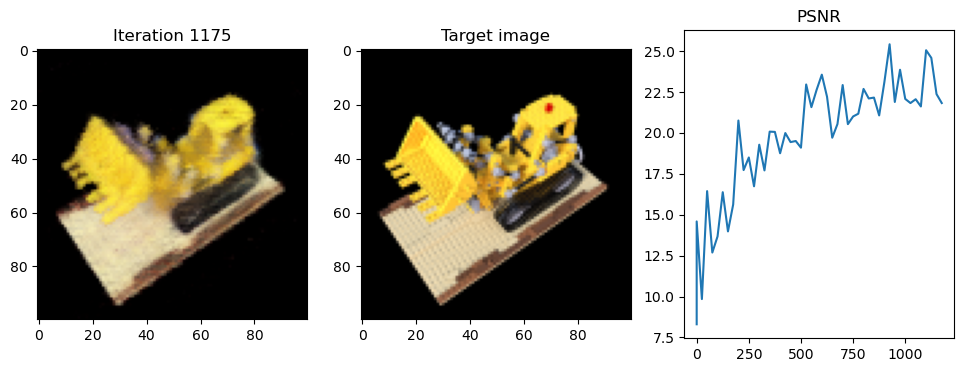

Iteration 1200  Loss: 0.0038  PSNR: 24.20  Time: 1.18 secs per iter,  24.96 mins in total


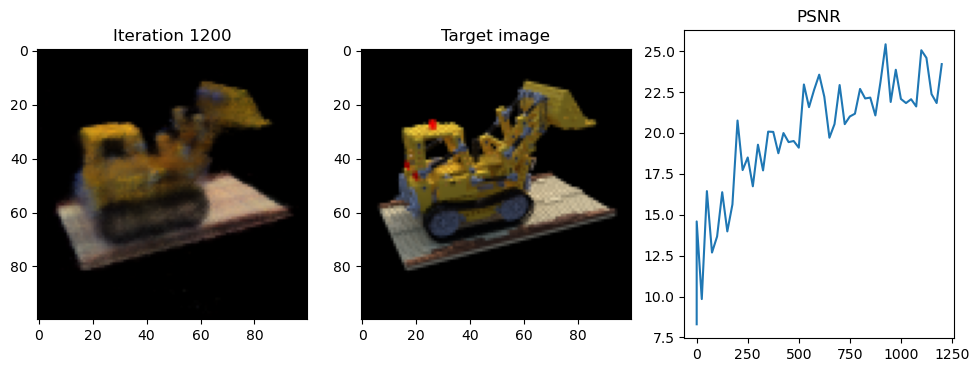

Iteration 1225  Loss: 0.0044  PSNR: 23.55  Time: 1.18 secs per iter,  25.45 mins in total


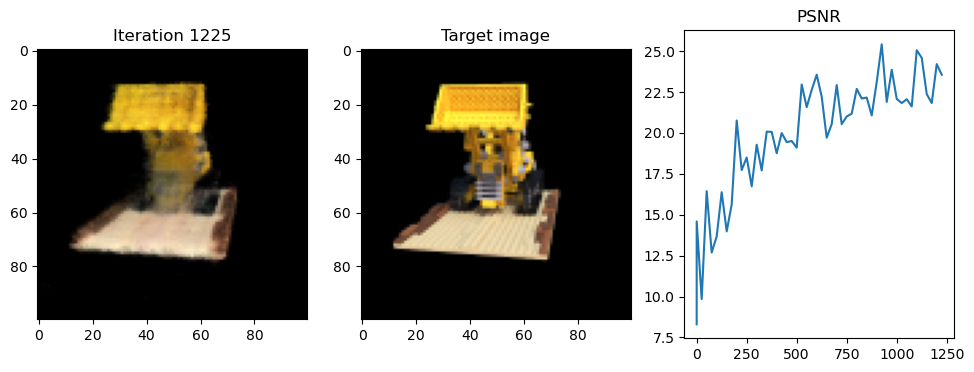

Iteration 1250  Loss: 0.0065  PSNR: 21.88  Time: 1.18 secs per iter,  25.95 mins in total


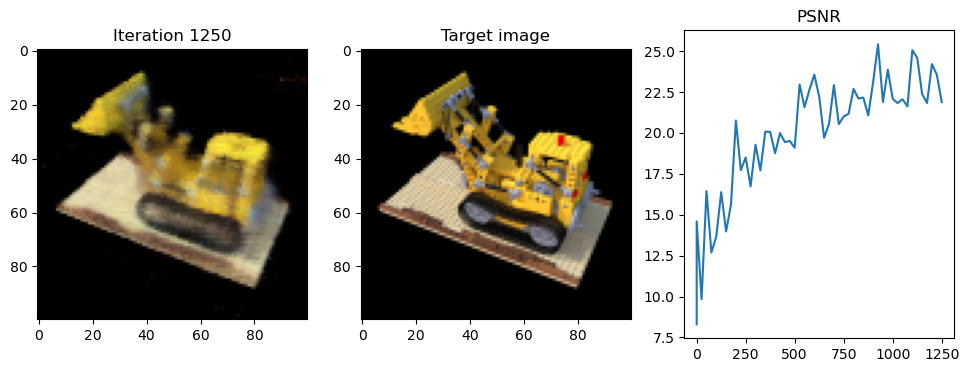

Iteration 1275  Loss: 0.0041  PSNR: 23.92  Time: 1.18 secs per iter,  26.44 mins in total


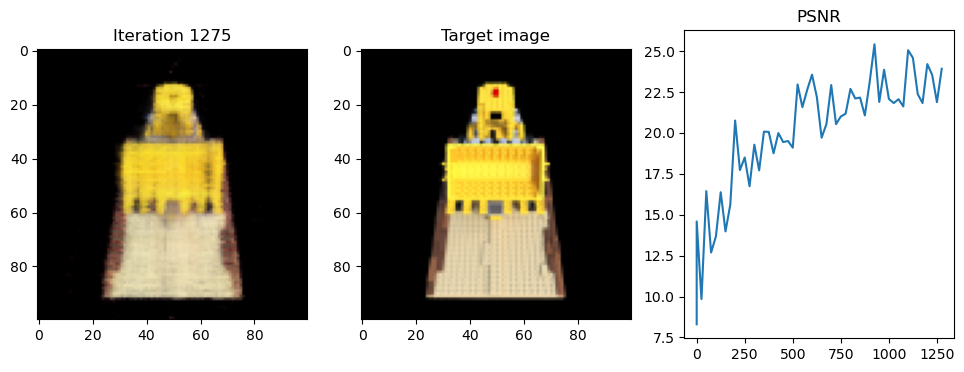

Iteration 1300  Loss: 0.0044  PSNR: 23.54  Time: 1.18 secs per iter,  26.93 mins in total


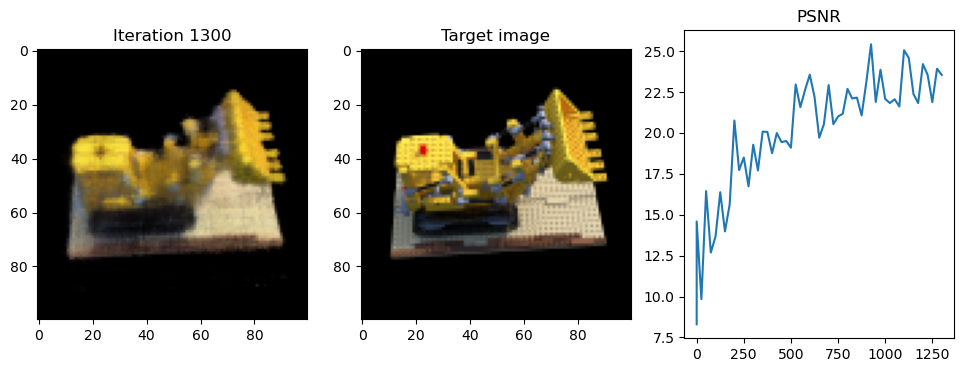

Iteration 1325  Loss: 0.0036  PSNR: 24.39  Time: 1.18 secs per iter,  27.42 mins in total


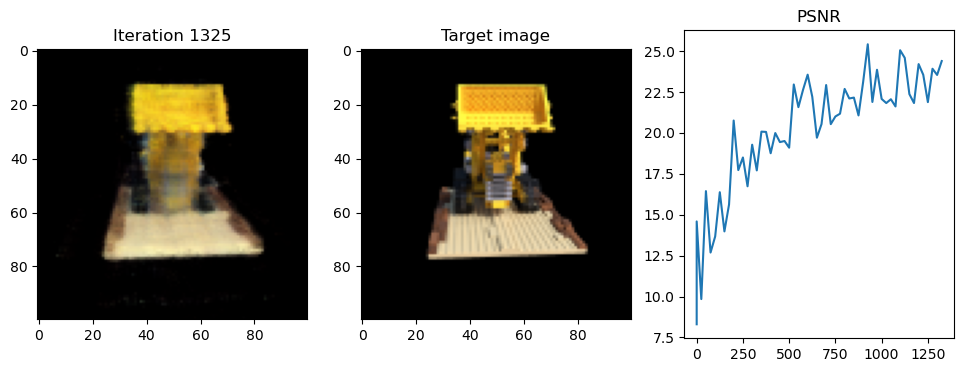

Iteration 1350  Loss: 0.0055  PSNR: 22.60  Time: 1.18 secs per iter,  27.92 mins in total


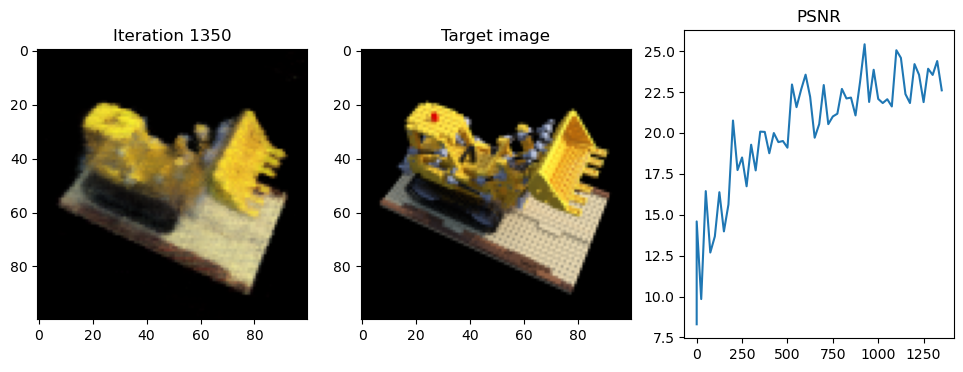

Iteration 1375  Loss: 0.0061  PSNR: 22.15  Time: 1.18 secs per iter,  28.41 mins in total


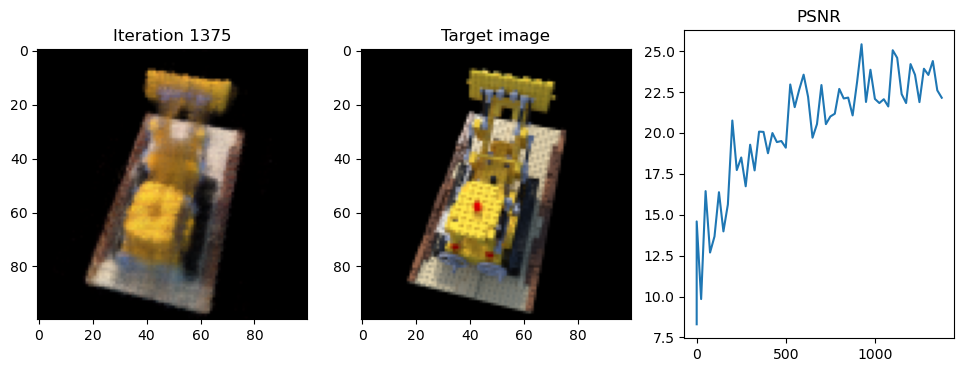

Iteration 1400  Loss: 0.0033  PSNR: 24.88  Time: 1.18 secs per iter,  28.90 mins in total


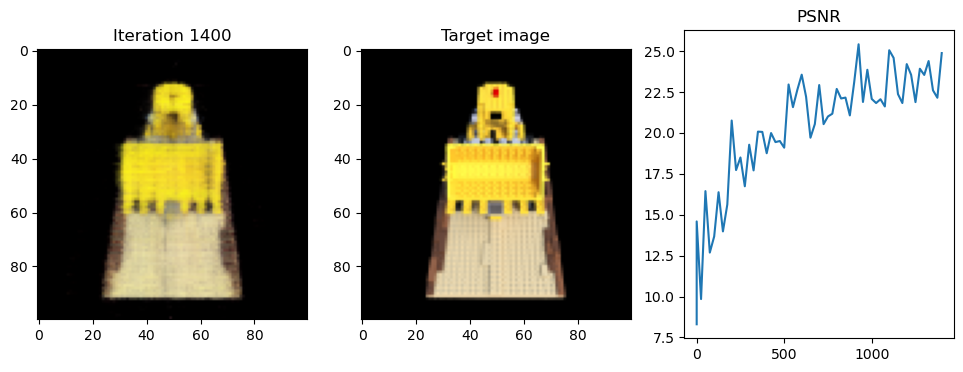

Iteration 1425  Loss: 0.0049  PSNR: 23.11  Time: 1.18 secs per iter,  29.39 mins in total


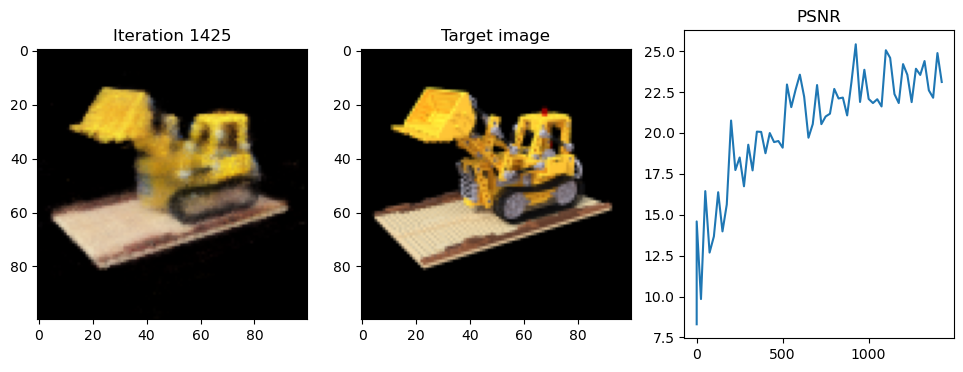

Iteration 1450  Loss: 0.0047  PSNR: 23.30  Time: 1.18 secs per iter,  29.88 mins in total


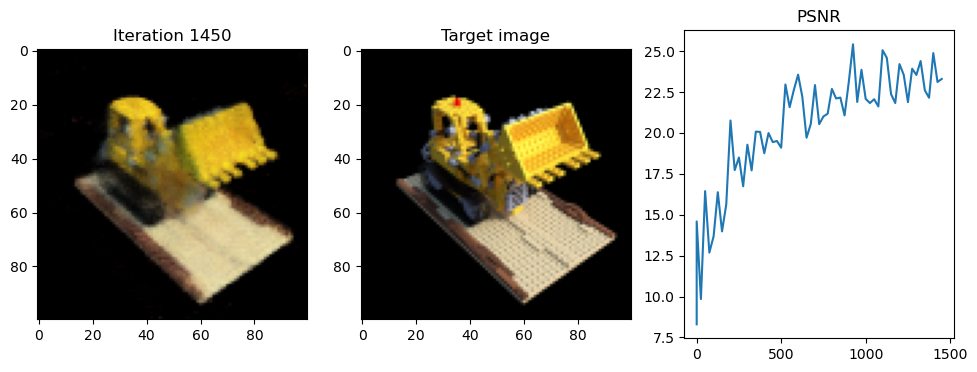

Iteration 1475  Loss: 0.0048  PSNR: 23.22  Time: 1.18 secs per iter,  30.38 mins in total


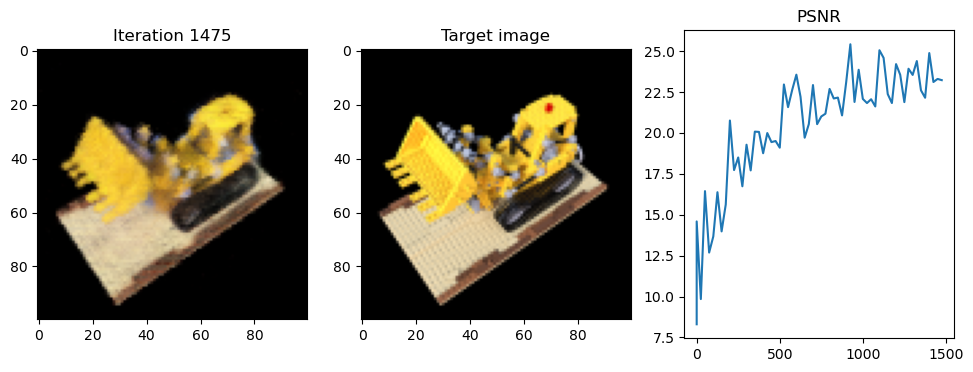

Iteration 1500  Loss: 0.0049  PSNR: 23.09  Time: 1.18 secs per iter,  30.87 mins in total


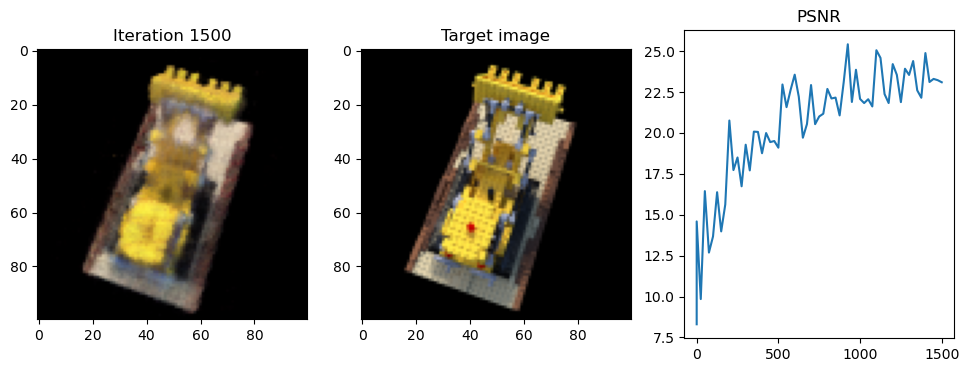

Iteration 1525  Loss: 0.0048  PSNR: 23.18  Time: 1.20 secs per iter,  31.37 mins in total


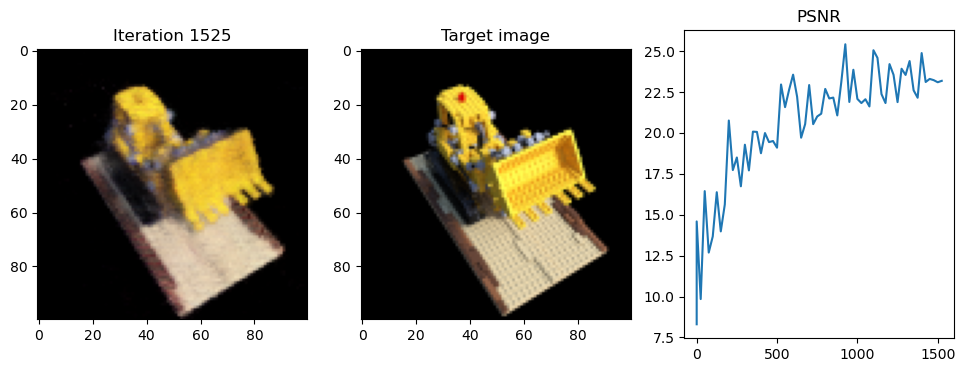

Iteration 1550  Loss: 0.0043  PSNR: 23.67  Time: 1.21 secs per iter,  31.87 mins in total


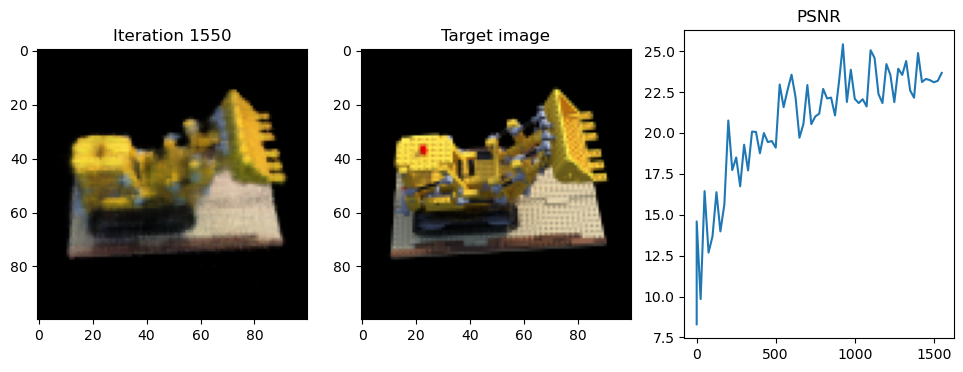

In [55]:
for i in range(iterations+1):

    #############################  TODO 2.6 BEGIN  ############################

    #choose randomly a picture for the forward pass
    idx = torch.randint(0, N, (1,)).item()

    random_image, random_pose = images[idx], poses[idx]
    random_image = random_image.to(device)
    random_pose = random_pose.to(device)


    # Run one iteration of NeRF and get the rendered RGB image.
    rec_image = one_forward_pass(height, width, intrinsics, random_pose, near, far, samples, model, num_x_frequencies, num_d_frequencies)
    optimizer.zero_grad()

    # Compute mean-squared error between the predicted and target images. Backprop!
    loss = criterion(rec_image, random_image)
    loss.backward()
    optimizer.step()


    torch.cuda.empty_cache()

    #############################  TODO 2.6 END  ############################
    # if i % 500 == 0:
    #   torch.save(model.state_dict(), 'nerf_{}.pt'.format(i) )
    #   torch.cuda.empty_cache()

    # Display images/plots/stats
    if i % display == 0:
        with torch.no_grad():
        #############################  TODO 2.6 BEGIN  ############################
            # Render the held-out view
            test_image = random_image.reshape(height, width, 3)
            test_rec_image = one_forward_pass(height, width, intrinsics, random_pose, near, far, samples, model, num_x_frequencies, num_d_frequencies)
            loss = criterion(test_rec_image, test_image)

            #calculate the loss and the psnr between the original test image and the reconstructed one.
            psnr = 10 * torch.log10(1./ loss)

        #############################  TODO 2.6 END  ############################

        print("Iteration %d " % i, "Loss: %.4f " % loss.item(), "PSNR: %.2f " % psnr.item(), \
                "Time: %.2f secs per iter, " % ((time.time() - t) / display), "%.2f mins in total" % ((time.time() - t0)/60))

        t = time.time()
        psnrs.append(psnr.item())
        iternums.append(i)

        plt.figure(figsize=(16, 4))
        plt.subplot(141)
        plt.imshow(test_rec_image.detach().cpu().numpy())
        plt.title(f"Iteration {i}")
        plt.subplot(142)
        plt.imshow(test_image.detach().cpu().numpy())
        plt.title("Target image")
        plt.subplot(143)
        plt.plot(iternums, psnrs)
        plt.title("PSNR")
        plt.show()

print('Done!')

In [ ]:
torch.save(model.state_dict(),'model_nerf.pt')